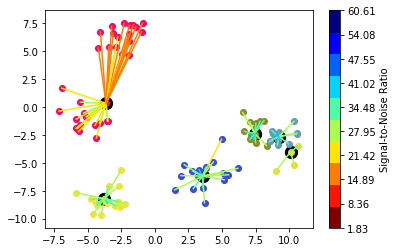

0.8185718059539795
{'Cluster Head': 'client39', 'Members': ['client16', 'client24', 'client37', 'client40', 'client44', 'client45', 'client48', 'client51', 'client58', 'client64', 'client75', 'client77', 'client81', 'client87', 'client89'], 'SNR': [23.74609281735312, 36.45074144900161, 32.72053983320635, 28.551171665432484, 21.67732519212027, 27.362450357277833, 23.243484928909353, 30.038157641392754, 28.43342601993699, 22.54951448358171, 32.636683580038344, 26.10848555288988, 28.863167046086478, 22.77205570226825, 26.61127398168731], 'CSI': [0.7411520196030607, 0.5423844343734113, 0.9941779736311223, 0.17733160424426342, 0.6348689653203351, 0.47414083022384834, 0.2298175026483793, 0.7661835201289782, 0.4475486850373208, 0.8594950202773654, 0.642063309968578, 0.004289488216364545, 0.30204916807876636, 0.464031784173526, 0.9891052072135427]}


In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
import syft as sy
import numpy as np
from Dataset import load_dataset, getImage
from utils import averageModels
from utils import averageModelscluster
import random
import math
import matplotlib.pyplot as plt
from ipynb.fs.full.K_clusters import cluster_former
from copy import deepcopy

In [2]:
P=2 #signal power threshold
#stream = BitStream()
#random.seed(10)
key=[]
for i in range (10000): #generating a random password to activate training (Pilot signal)
    temp=random.randint(0,1)
    key.append(temp)

key1=[0]*len(key)
for i in range (len(key)):   #bpsk modulation
    if(key[i]==1):
        #print("yay")
        key1[i]=-math.sqrt(P)
    else:
        key1[i]=math.sqrt(P)

#print(key)
        
key_np=np.array(key1)

In [3]:
class Arguments():
    def __init__(self):
        self.images = 10000
        self.clients = 50
        self.rounds = 200
        self.epochs = 3
        self.local_batches = 64
        self.lr = 0.001
        self.C = 1 #fraction of clients used in the round
        self.drop_rate = 0 #fraction of devices in the selected set to be dropped for various reasons
        self.torch_seed = 0 #same weights and parameters whenever the program is run
        self.log_interval = 64
        self.iid = 'noniid'
        self.split_size = int(self.images / self.clients)
        self.samples = self.split_size / self.images 
        self.use_cuda = False
        self.save_model = True
        self.numclusters=4

args = Arguments()

In [4]:
#checking if gpu is available
#use_cuda = args.use_cuda and torch.cuda.is_available()
use_cuda=False
device = torch.device("cuda:0" if use_cuda else "cpu")
kwargs = {'num_workers': 1, 'pin_memory': True} if use_cuda else {}

hook = sy.TorchHook(torch)
me = hook.local_worker
clients = []

#generating virtual clients
for i in range(args.clients):
    clients.append({'hook': sy.VirtualWorker(hook, id="client{}".format(i+1))})
#print(clients)

In [5]:
global_train, global_test, train_group, test_group = load_dataset(args.clients, args.iid) #load data

for inx, client in enumerate(clients):  #return actual image set for each client
    trainset_ind_list = list(train_group[inx]) 
    client['trainset'] = getImage(global_train, trainset_ind_list, args.local_batches)
    client['testset'] = getImage(global_test, list(test_group[inx]), args.local_batches)
    client['samples'] = len(trainset_ind_list) / args.images #useful while taking weighted average


/home/test/anaconda3/lib/python3.7/site-packages/torchvision/datasets/mnist.py:45: UserWarning: train_labels has been renamed targets
  warnings.warn("train_labels has been renamed targets")


In [6]:
#load dataset for global model (to compare accuracies)
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])
global_test_dataset = datasets.MNIST('./', train=False, download=True, transform=transform)
# global_test_dataset = torch.utils.data.random_split(global_test_dataset, [10000, len(global_test_dataset)-10000])[0]
global_test_loader = DataLoader(global_test_dataset, batch_size=args.local_batches, shuffle=True)

In [7]:
"""class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        #self.quant = torch.quantization.QuantStub()
        self.conv1 = nn.Conv2d(1, 5, 5, 1)
        self.conv2 = nn.Conv2d(5, 10, 5, 1)
        self.fc1 = nn.Linear(4*4*10, 50) #10 iid #50 non iid
        self.fc2 = nn.Linear(50, 10)

    def forward(self, x):
        #x=self.quant(x)
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, 2, 2)
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2, 2)
        x = x.view(-1, 4*4*10
                   )
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return F.log_softmax(x, dim=1) """

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 10, kernel_size=5)
        self.conv2 = nn.Conv2d(10, 20, kernel_size=5)
        self.conv2_drop = nn.Dropout2d()
        self.fc1 = nn.Linear(320, 50)
        self.fc2 = nn.Linear(50, 10)

    def forward(self, x):
        x = F.relu(F.max_pool2d(self.conv1(x), 2))
        x = F.relu(F.max_pool2d(self.conv2_drop(self.conv2(x)), 2))
        x = x.view(-1, 320)
        x = F.relu(self.fc1(x))
        x = F.dropout(x, training=self.training)
        x = self.fc2(x)
        return F.log_softmax(x)

In [8]:
def fedprox(params,global_params):
    global_param=[]
    ind=0
    for gp in global_params:
        global_param.append(gp)
    for p in params:
    #                 print(p.grad)
        lr=0.001
        mu=0.1
        if(p.grad is None):
            continue
        grad=p.grad.data #batch gradients
        p.data.sub_(lr,(grad+mu*(p.data.clone()-global_param[ind].data.clone())))
        ind+=1
    return(p)

In [9]:
def ClientUpdate(args, device, client,key_np,key,snr,csi,mu,head):
    gc=False
    client['model'].train()
    #simulating a wireless channel
    poptim=max((1/mu-1/csi),0)
    #print(mu,csi)
    print("Power Allocated=",poptim)
    print("CSI=",csi)
    
    snr__=10**(snr/10)
    
    absh=csi*poptim/snr__
    x=random.uniform(0,absh)
    #print(x)
    y=math.sqrt(absh*absh-x*x)
    #x=x*100
    #y=y*100
    #x=random.random()
    #y=random.random()
    #snr=10*math.log(poptim/(std*std),10)
    std=math.sqrt(poptim/snr__*absh*absh) #channel noise
    
    #print(x,y)
    h=complex(x,y)
    #std=math.sqrt(abs(h)/csi)
    #snr=poptim/(std*std)
    #print(std)
    print("SNR=",snr)
    #print("csi",abs(h)/(std*std))
    
    
    if(poptim!=0):
        data=client['model'].conv1.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data

    
    #print(client['model'].conv1.weight.size)
    client['model'].send(client['hook'])
    head['model'].send(client['hook'])
    print("Client:",client['hook'].id)
    
    key_np_received=h*key_np+(np.random.randn(len(key_np))*std*2)
    #print(key_np_received)
    key_np_received=(key_np_received/(h)).real
    
    for o in range (len(key_np_received)):  #demodulation bpsk
        if(key_np_received[o]>=0):
            key_np_received[o]=0
        else:
            key_np_received[o]=1
    
    key_np_received=key_np_received.tolist()
    key_np_received = [int(item) for item in key_np_received]
    #key_np=key_np.tolist()
    
    
    if(sum(np.bitwise_xor(key,key_np_received))/len(key)==0 and poptim>0): #...............................................checking if channel is good enough for transmission by checking BER..................................#
        gc=True #considering the client model for training
        for epoch in range(1, args.epochs + 1):
            for batch_idx, (data, target) in enumerate(client['trainset']): 
                data = data.send(client['hook'])
                target = target.send(client['hook'])
                #client['optim'].zero_grad()
                #train model on client
                data, target = data.to(device), target.to(device) #send data to cpu/gpu (data is stored locally)
                output = client['model'](data)
                loss = F.nll_loss(output, target)
                loss.backward()
                client['optim'].step()
                params=client['model'].parameters()
                gp=head['model'].parameters()
                #params=fedprox(params,gp) 
                
                if batch_idx % args.log_interval == 0:
                    loss = loss.get() 
                    print('Model {} Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                        client['hook'].id,
                        epoch, batch_idx * args.local_batches, len(client['trainset']) * args.local_batches, 
                        100. * batch_idx / len(client['trainset']), loss))
    else:
        print("Poor Channel, client not taken for averaging in this round")
            
                    
    client['model'].get()
    head['model'].get()
    # print()
         #CHANGE
    if(poptim!=0):
        data=client['model'].conv1.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data
    #CHANGE ENDS
    print()
    return gc

In [10]:
def test(args, model, device, test_loader, name,fed_round):
    model.eval()    #no need to train the model while testing
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            if(use_cuda and fed_round==0):
                data,target=data.cuda(),target.cuda()
                #model.cuda()
            else:
                data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item() # sum up batch loss
            pred = output.argmax(1, keepdim=True) # get the index of the max log-probability 
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss for {} model: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        name, test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    return([100. * correct / len(test_loader.dataset),test_loss])

In [11]:
torch.manual_seed(args.torch_seed)

In [12]:
def distort(neighbours,snrs):
    ind=0
    poptim=2
    csi=random.random()
    distorted_models=[]
    for client in neighbours:
        snr=snrs[ind]
        ind+=1
        snr__=10**(snr/10)
        absh=csi*poptim/snr__
        x=random.uniform(0,absh)
        y=math.sqrt(absh*absh-x*x)
        std=math.sqrt(poptim/snr__*absh*absh) #channel noise
        h=complex(x,y)
        data=client['model'].conv1.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data
        
        distorted_models.append(client)
    return(distorted_models)
        

In [13]:
def decentralized(clients,snrs,weights):
    big_daddy_of_distorted_models=[]
    for client in clients:
        distorted_models=[]
        snr_list=[]
        for snr in snrs:
            if(client['hook'].id in snr):
                snr_list.append(snr[2])
        neighbours_c = [x for x in clients if x != client]
        neighbours={}
        jjj=[jkl for jkl in range(len(neighbours_c))]
        
        dictionary = dict(zip(jjj, neighbours_c))
        #for jjj in range(len(neighbours_c)):
        #   neighbours[jjj].append(neighbours_c[jjj])
        distorted_models=distort(neighbours,snr_list)
        distorted_models.append(client)
        big_daddy_of_distorted_models.append(distorted_models)
    
    
    weight_final1=[]
    for oho in big_daddy_of_distorted_models:
        weight_final=[]
        for comeon in oho:
            for w in weights:
                if(comeon['hook'].id==w[0]):
                    weight_final.append(w[1])
        weight_final1.append(weight_final)
    
    final_heads=[]
    nets=[]
    ind=0
    for client in clients:
        for oof in big_daddy_of_distorted_models:
            if(client==oof[0]):
#                 print(client)
#                 print("shut up")
#                 print(distorted_models)
#                 print("shut up")
#                 print(weight_final1)
                
                overall=Net()
                overall=averageModelscluster(overall,distorted_models,weight_final1[ind])
                client['model'].load_state_dict(overall.state_dict())
                ind+=1
                final_heads.append(client)
                nets.append(overall)
    
    return(final_heads,nets)
        
            
            

/home/test/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:393: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/home/test/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


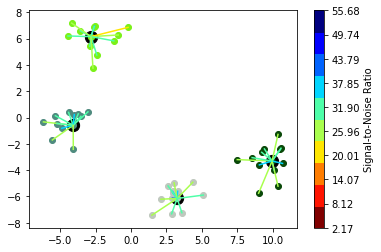

0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.318167


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.056067
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.539156

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.362960


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.486569
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.007798

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.390078
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.001202
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.402413

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.353332
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.109728
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.670152

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.320353
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.834970
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.191023

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

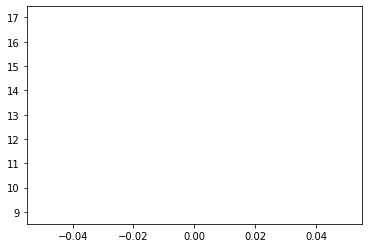

ROUND 0
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.306953


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.042667
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.417350

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.316111


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.292973
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.184344

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302482
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.970716
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.819088

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.309297
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.122940
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.793889

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.308935
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.737078
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.737988

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

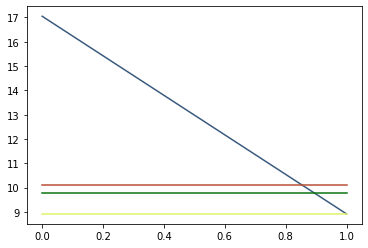

ROUND 1
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.306647


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.919899
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.532419

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.330343


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.643334
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.143271

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302408
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.006111
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.632064

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.309760
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.028641
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.722952

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.321164
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.865966
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.242635

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

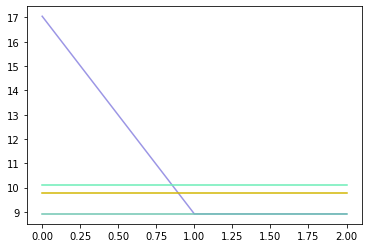

ROUND 2
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.323793


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.694143
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.154113

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.346020


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.437081
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.799347

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.295204
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.751688
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.543534

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.300760
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.966116
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.660793

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.352359
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.585455
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.639001

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

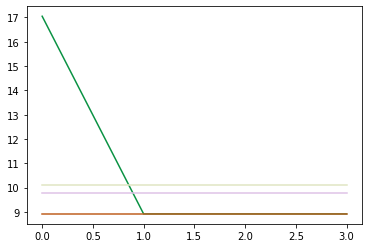

ROUND 3
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.310188


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.548862
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.175811

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.384687


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.151814
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.068998

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.314443
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.770000
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.357930

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.305923
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.826670
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.534407

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.359719
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.576230
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.019265

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

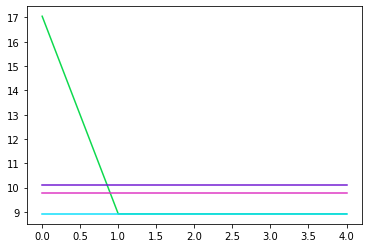

ROUND 4
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.286695


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.437867
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.094834

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.422090


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.045238
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.663321

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.350815
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.539712
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.257283

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.246034
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.716032
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.479891

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.369933
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.391033
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.019862

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

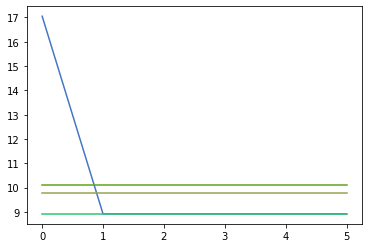

ROUND 5
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.333750


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.358232
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.041245

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.418864


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.868627
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.877626

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.375474
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.560326
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.272132

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.283210
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.720752
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.397359

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.366763
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.379829
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.070088

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

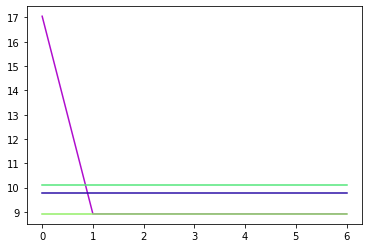

ROUND 6
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.320237


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.361478
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.012681

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.459624


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.915995
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.623427

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.246034
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.642492
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.394163

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.381320
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.174744
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.926065

Power Allocated= 0
CSI= 0.02416441435143979
SNR= 21.44581976328374
Client: client26
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.444

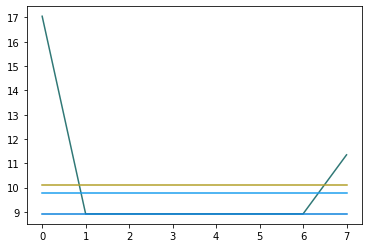

ROUND 7
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.303548


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.174490
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.025980

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.426417


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.862023
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.608489

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.343214
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.510615
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.340376

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.315254
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.631506
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.373393

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.463241
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.099967
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.894128

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

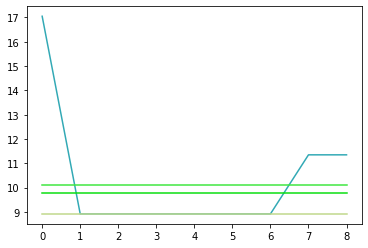

ROUND 8
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.332337


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.226784
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.021820

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.504364


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.732264
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.511167

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.342413
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.453098
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.221522

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.356025
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.586158
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.415957

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.442758
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.087532
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.095965

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

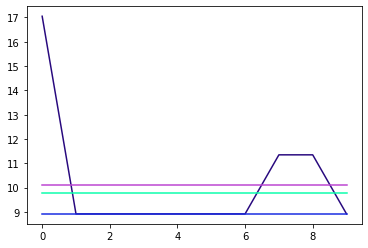

ROUND 9
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.429131


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.289842
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.153671

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.452829


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.927049
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.829909

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.364364
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.313815
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.129967

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.379406
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.529210
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.317175

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.423862
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.103751
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.179835

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

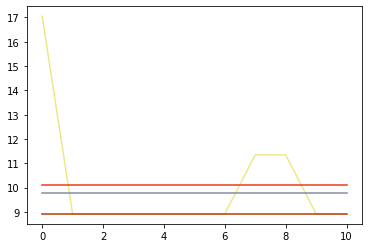

ROUND 10
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.343944


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.113952
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.087319

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.545852


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.611026
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.612283

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.388102
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.420369
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.232231

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.301605
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.661287
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.270213

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.416636
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.077018
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.019974

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

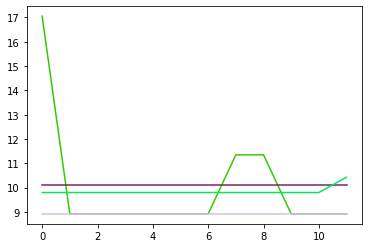

ROUND 11
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.395595


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.365791
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.461466

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.525416


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.764613
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.665654

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.333932
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.376643
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.128308

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.354630
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.474650
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.170513

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.420836
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.953760
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.098322

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

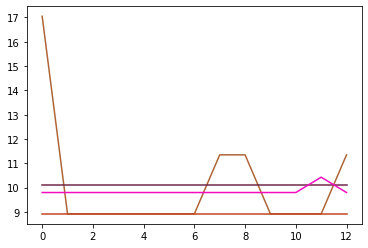

ROUND 12
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.390383


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.171355
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.150229

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.529456


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.590029
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.356425

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.441322
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.230441
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.078570

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.343517
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.396687
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.126592

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.444411
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.056328
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.048053

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

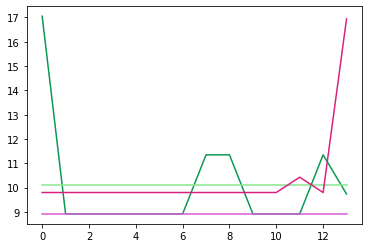

ROUND 13
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.420788


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.138722
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.466094

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.524204


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.478260
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.246920

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.318996
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.369515
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.092017

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.244981
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.459464
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.164789

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.475913
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.120287
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.305381

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

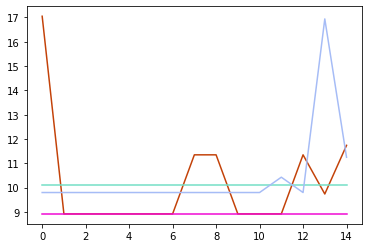

ROUND 14
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.428261


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.130719
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.042362

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.500409


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.451437
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.162381

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.304787
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.420640
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.188657

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.488873
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.960683
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.982283

Power Allocated= 0
CSI= 0.02416441435143979
SNR= 21.44581976328374
Client: client26
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.444

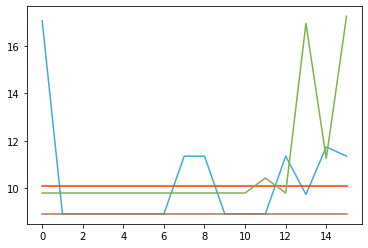

ROUND 15
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.438042


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.085242
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.884273

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.512651


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.411459
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.089943

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.308053
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.455650
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.424471

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.305259
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.447305
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.999254

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.464619
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.892413
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.162992

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

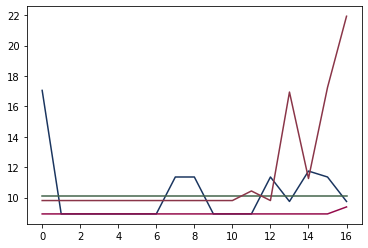

ROUND 16
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.449398


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.057354
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.818056

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.553638


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.396176
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.080817

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.405624
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.404594
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.142641

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.344434
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.326603
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.816427

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.517008
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.930082
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.706932

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

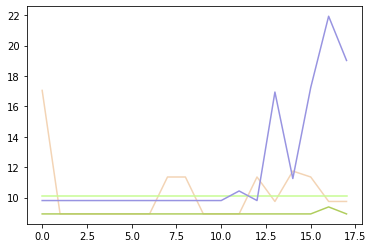

ROUND 17
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.342520


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.057003
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.700332

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.645178


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.309724
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.205600

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.420906
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.260122
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.903482

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.244701
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.159662
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.700237

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.435865
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.691772
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.548226

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

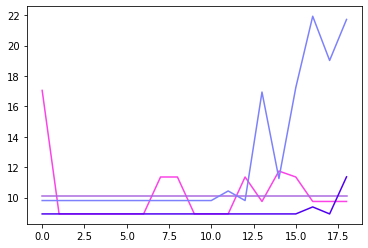

ROUND 18
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.360788


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.971132
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.753069

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.557752


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.332658
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.036898

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.336584
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.008674
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.041967

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.389231
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.290421
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.699022

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.510243
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.639006
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.366095

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

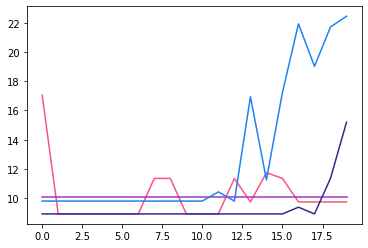

ROUND 19
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.465402


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.849426
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.395574

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.571135


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.244345
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.075971

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.458451
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.197505
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.019518

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.396137
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.098126
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.599128

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.494696
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.916939
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.781598

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

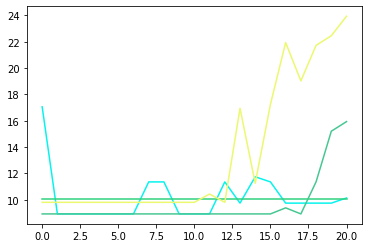

ROUND 20
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.434212


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.865991
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.619860

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.555182


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.209106
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.207707

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.354847
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.229450
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.022450

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.241013
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.022807
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.849163

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.504815
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.688189
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.693992

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

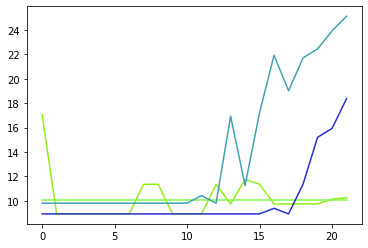

ROUND 21
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.423517


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.689122
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.531441

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.605755


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.260682
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.089736

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.390485
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.030475
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.833174

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.337948
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.894732
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.682884

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.515570
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.746238
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.884851

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

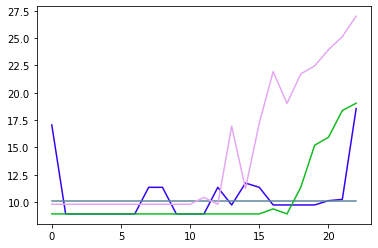

ROUND 22
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.453417


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.684002
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.489247

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.542215


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.228677
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.095726

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.374801
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.780043
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.657780

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.407660
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.929396
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.672486

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.525506
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.739365
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.544744

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

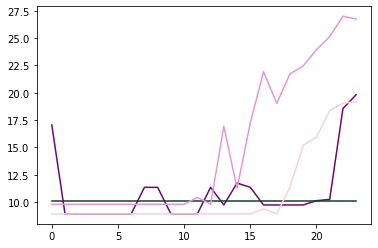

ROUND 23
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.455731


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.514038
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.341314

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.561049


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.239294
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.100799

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.403443
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.740039
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.794789

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.346936
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.722785
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.699508

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.543543
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.052792
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.910274

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

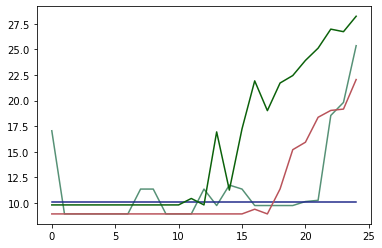

ROUND 24
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.469211


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.638110
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.135406

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.531914


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.349605
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.147139

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.282462
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.942374
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.648442

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.315673
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.763714
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.573811

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.467576
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.508619
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.407253

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

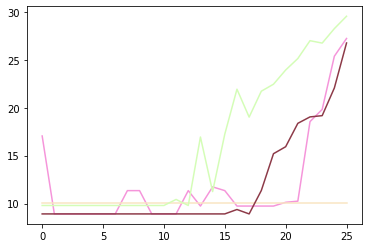

ROUND 25
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.445054


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.385134
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.117310

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.509398


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.111756
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.025651

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.352896
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.727146
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.334948

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.364465
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.703379
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.448919

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.471560
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.547570
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.355917

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

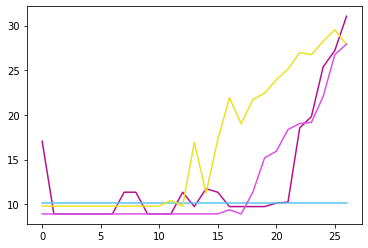

ROUND 26
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.379346


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.434671
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.177041

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.554469


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.068496
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.084218

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.440939
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.668839
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.433295

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.257232
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.547245
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.218361

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.406130
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.363093
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.379162

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

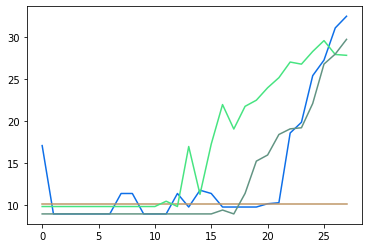

ROUND 27
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.132373


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.303414
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.331464

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.694111


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.118981
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.091333

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.441051
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.511064
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.275157

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.112929
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.430566
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.399397

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.356816
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.559719
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.584800

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

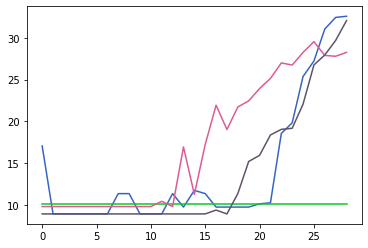

ROUND 28
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.303935


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.443980
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.173598

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.541732


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036980
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.034262

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.120006
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.693729
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.486811

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.102238
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.424927
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.419831

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.377423
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.422192
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.243636

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

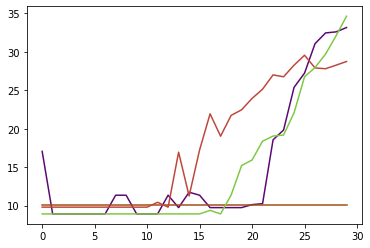

ROUND 29
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.393699


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.248156
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.391941

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.531128


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.062309
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006796

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.278497
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.768469
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.553689

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.138900
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.611598
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.138688

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.339869
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.796638
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.307404

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

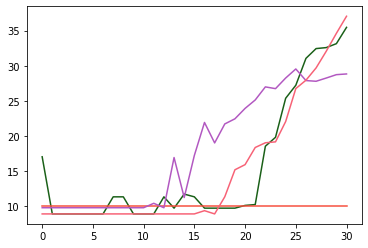

ROUND 30
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.336335


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.311014
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.062126

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.516752


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.142611
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.097767

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.181892
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.488049
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.471497

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.190679
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.550950
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.117647

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.386150
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.199153
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.567488

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

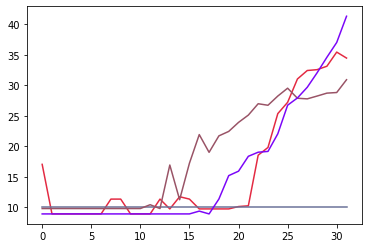

ROUND 31
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.251945


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.337356
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.078524

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.496551


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.070949
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.029132

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.324233
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.655137
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.429088

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.059829
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.490722
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.521938

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.273499
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.333150
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.107211

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

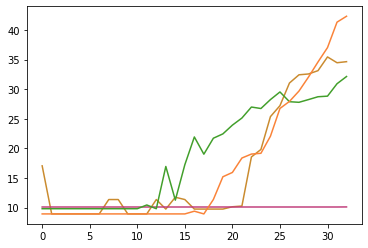

ROUND 32
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.075490


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.160561
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.188043

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.476542


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.055881
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.098734
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.557185
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.359900

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.262919
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.347061
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.353294

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.270757
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.264454
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.322149

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

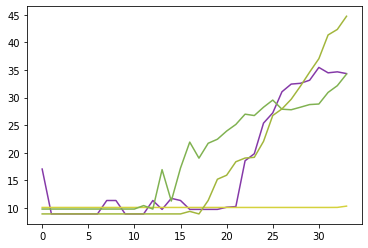

ROUND 33
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.086838


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.202634
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.132431

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.524768


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.146281
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000019

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.260955
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.248023
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.342410

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.219845
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.350059
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.160500

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.219116
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.209900
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.064728

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

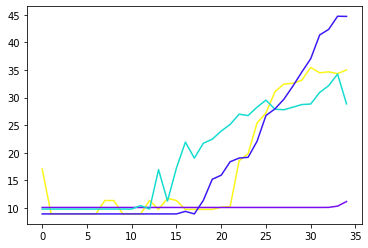

ROUND 34
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.027591


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.172039
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.080000

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.458180


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.059254
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.034965

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.155069
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.328989
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.384729

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.243955
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.356449
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.131757

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.210713
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.249649
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.396189

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

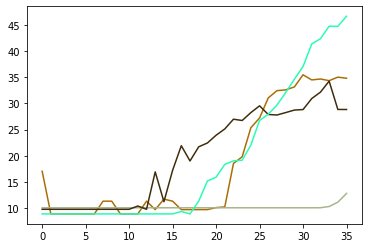

ROUND 35
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.094868


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.213173
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.101078

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.422659


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002898
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001894

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.351322
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.300822
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.211454

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.049223
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.336234
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.051088

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.164485
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.396119
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.238087

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

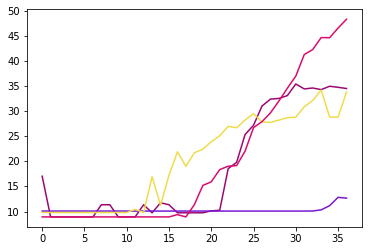

ROUND 36
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.023486


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.151512
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.185415

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.474120


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023477
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.043036

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.310942
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.381297
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.177747

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.174790
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.198767
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.203120

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.080651
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099405
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.033719

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

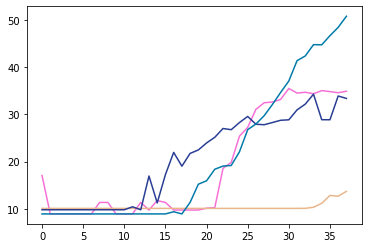

ROUND 37
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.185710


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.128437
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.085118

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.421384


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.045001
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.102545

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.249353
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.428444
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.380268

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.245415
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.120004
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.149310

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.195964
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.392927
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.264873

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

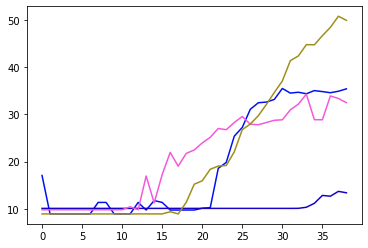

ROUND 38
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.997164


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.055765
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.024248

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.461490


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.028304
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000122

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.356172
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.274226
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.364819

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.728960
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.190847
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.237530

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.097136
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.234260
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.042319

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

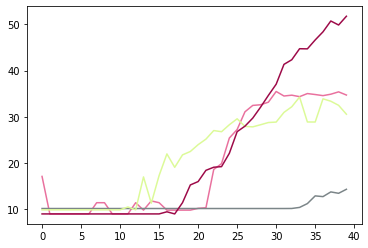

ROUND 39
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.045595


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.273611
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.303168

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.397158


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013583
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000075

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.931274
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.298299
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.242486

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.031831
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.239694
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.402436

Power Allocated= 0
CSI= 0.02416441435143979
SNR= 21.44581976328374
Client: client26
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.444

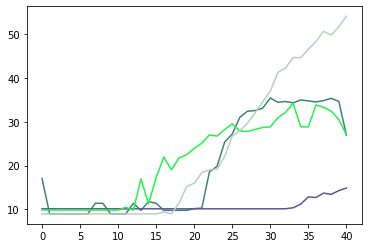

ROUND 40
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.811805


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.146090
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008940

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.340979


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.059378
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.186497

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.054039
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.377277
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.159659

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.936827
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.113888
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.347128

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.940815
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.290102
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.059966

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

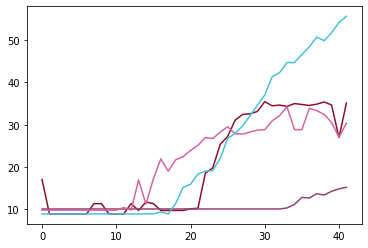

ROUND 41
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.091630


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.070925
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.213453

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.370857


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012159
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.072484

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.980574
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.397255
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.166928

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.942814
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.212339
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.174471

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.971566
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.303529
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.015071

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

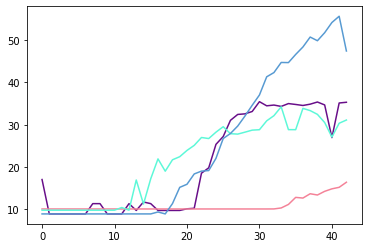

ROUND 42
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.780170


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.106956
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.071115

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.695708


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.074456
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.374471

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.424100
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.227561
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.103178

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.643954
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.158947
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.386429

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.050909
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.285370
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.588742

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

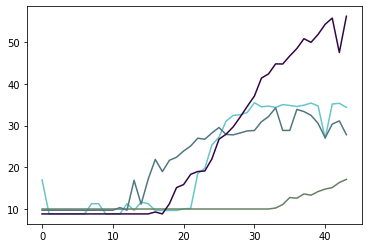

ROUND 43
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.861934


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.088211
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.244426

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.440646


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.173918
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.451384

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.910674
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.188699
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.222108

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.975507
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.157459
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.079833

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.028688
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099610
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.365744

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

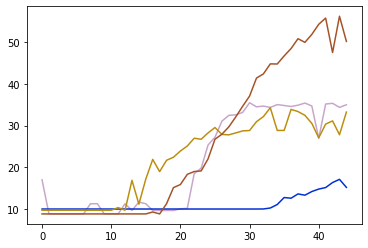

ROUND 44
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.721446


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.195610
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.158712

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.721710


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000476
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.149592

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.212375
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.257698
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.334642

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.339193
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.190451
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.111035

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.946688
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.304458
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.086952

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

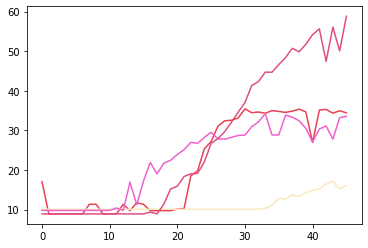

ROUND 45
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.945568


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.054558
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.210630

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.413595


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004066
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000319

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.141007
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.225509
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.219567

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.759064
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037671
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011859

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.906440
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.167202
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.052767

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

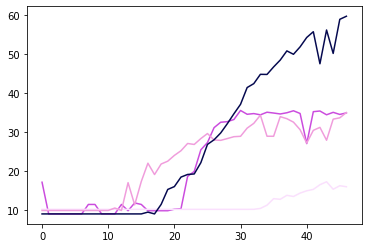

ROUND 46
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.594350


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.139254
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.038291

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.344133


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.068603
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.408753

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.865494
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.323321
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.108570

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.998360
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.122020
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.092154

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.891816
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.063886
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.033822

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

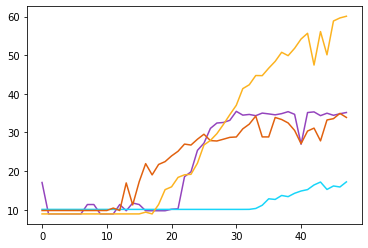

ROUND 47
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.718109


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031798
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.625603

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.354989


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010131
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.110585

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.071145
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.087321
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.107009

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.398520
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.098038
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.119948

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.893285
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.087288
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.189151

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

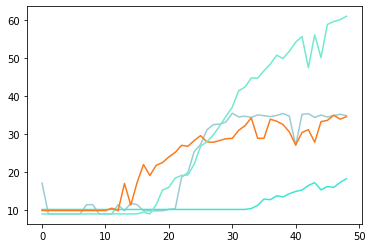

ROUND 48
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.946490


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.134055
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.325939

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.249946


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003525
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000814

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.979034
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.340893
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.171843

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.815306
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.393056
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.034788

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.885599
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.208489
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028492

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

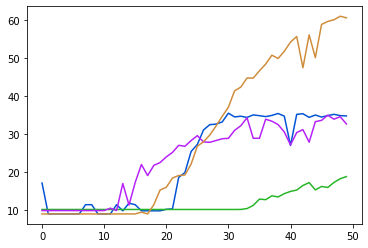

ROUND 49
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.816949


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.035785
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003271

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.196532


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002477
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.026426

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.813383
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.288982
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.168393

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.928550
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.113554
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.057083

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.642113
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048318
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.245454

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

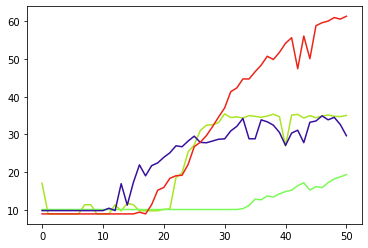

ROUND 50
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.603628


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.080717
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.018122

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.126726


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002699
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.088551

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.881283
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.188067
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.202547

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.420573
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.119849
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.469239

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.803930
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.299551
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.037358

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

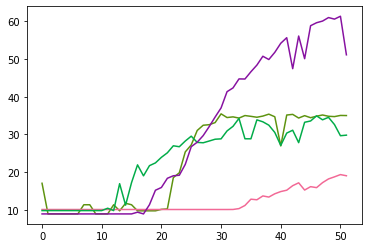

ROUND 51
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.535472


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.082217
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009848

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.704416


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008732
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001501

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.259301
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.255138
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.472655

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.730756
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.076635
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.072702

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.820901
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.092941
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.037614

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

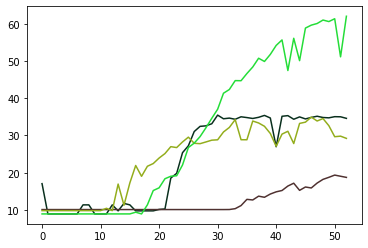

ROUND 52
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.839420


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.073711
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.060194

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.514979


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014041
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.190425

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.074224
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.125545
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.217480

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.696249
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.181207
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.749558

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.794703
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.150257
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.337143

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

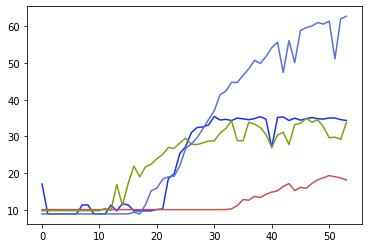

ROUND 53
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.653141


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.022205
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.110996

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.172478


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001217
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.832827
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.270461
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.109174

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.727800
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.197680
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.048734

Power Allocated= 0
CSI= 0.02416441435143979
SNR= 21.44581976328374
Client: client26
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.444

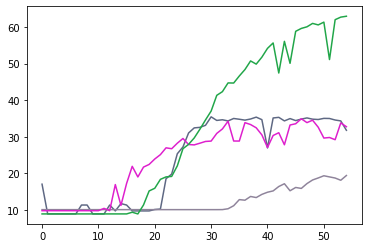

ROUND 54
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.804470


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.082815
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004084

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.120038


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.017285
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.926507
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.329524
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.180731

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.808185
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.230141
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.106284

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.853015
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024432
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.033352

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

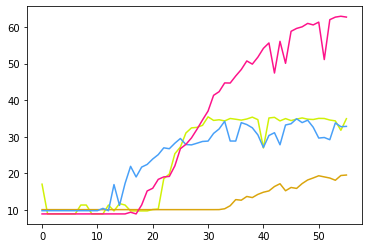

ROUND 55
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.738063


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.079357
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.321104

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.063668


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000415
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000033

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.713662
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.234015
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.092771

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.913423
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.354717
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.043305

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.621836
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011300
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001134

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

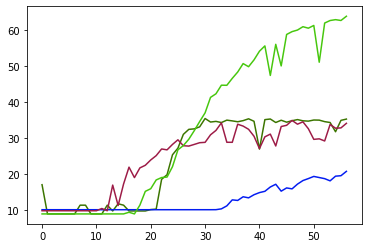

ROUND 56
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.646978


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.145191
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004625

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.190162


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.022648
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.145376

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.045162
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.109555
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.056032

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.870019
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.142526
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.090942

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.300160
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.123932
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008758

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

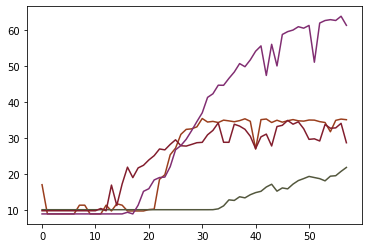

ROUND 57
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.558142


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.032520
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.030582

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.070867


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.032535
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001715

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.693978
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.424917
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.218328

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.717513
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.108057
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.143749

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.883532
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.054653
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.130728

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

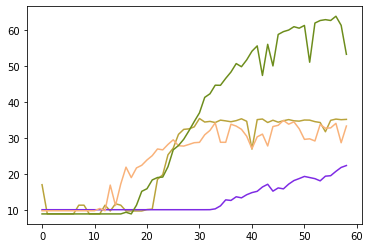

ROUND 58
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.404117


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.045103
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.055644

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.644660


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011258
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000397

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.371673
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.070260
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.094168

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.423607
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.223384
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.115795

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.745100
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053831
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.127266

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

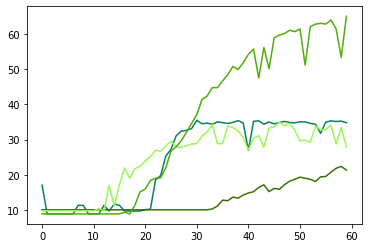

ROUND 59
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.702344


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.062888
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.030219

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.012318


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000112
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.094908

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.574943
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.153047
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.138313

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.569868
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.191595
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.243443

Power Allocated= 0
CSI= 0.02416441435143979
SNR= 21.44581976328374
Client: client26
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.444

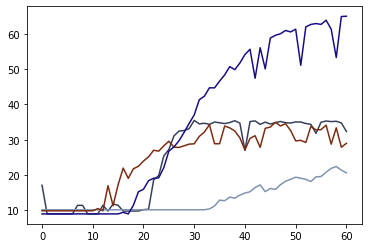

ROUND 60
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.271149


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.025299
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.050818

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.179941


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000140
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000211

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.972635
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.354863
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.294303

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.844253
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.094517
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.147346

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.685328
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019753
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.234612

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

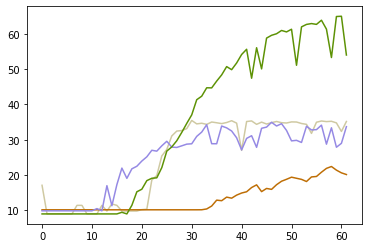

ROUND 61
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.215553


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.069409
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004942

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.716319


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001994
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.032958

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.263052
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.058967
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.280746

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.379580
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.159077
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009874

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.977853
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.150412
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.100328

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

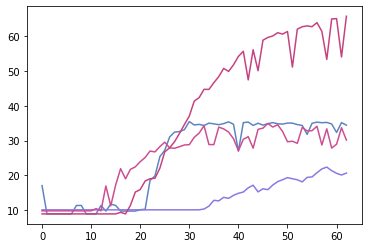

ROUND 62
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.606581


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.066286
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.053368

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.102732


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000369
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.153938

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.810606
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.207371
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.054737

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.309645
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.134889
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.307524

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.603025
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.376144
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.126013

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

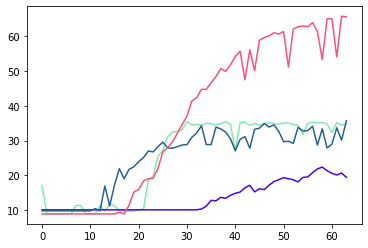

ROUND 63
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.745075


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003486
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.233633

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.231636


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005703
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000518

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.082109
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.093879
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.362192

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.367329
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.067256
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.013453

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.755099
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.074936
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.064878

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

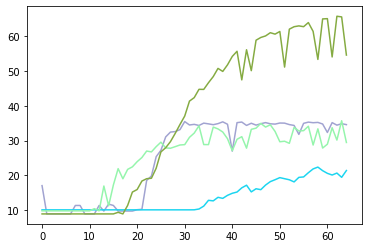

ROUND 64
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.355811


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016270
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.023281

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.739609


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000694
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000168

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.456228
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.129924
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.045981

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.431194
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.371139
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.040714

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.679664
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021689
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.182747

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

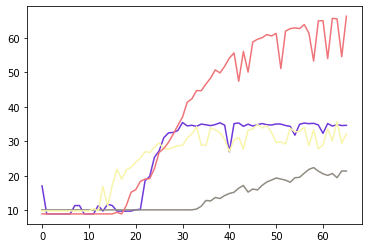

ROUND 65
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.439977


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.034938
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.031011

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.431668


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.090939
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000011

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.153397
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.089851
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.213201

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.473736
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.402959
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.610255

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.308869
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.286943
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.040147

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

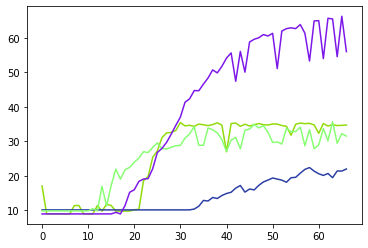

ROUND 66
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.365499


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053448
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.110635

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.526708


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009958
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.073866

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.800821
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.113918
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.017560

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.391179
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.163596
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.054461

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.427261
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053725
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.014492

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

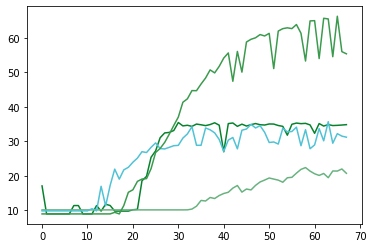

ROUND 67
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.327640


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031329
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.094074

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 3.027267


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002987
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.130669

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.293559
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.342699
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.180202

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.415583
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.094733
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.127951

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.823002
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.022420
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.043814

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

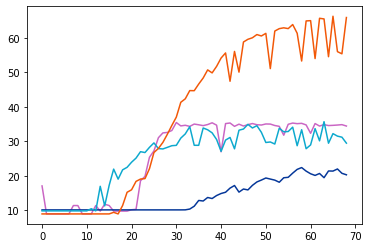

ROUND 68
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.459483


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.074167
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.101234

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.334447


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027839
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.281980

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.234614
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.142631
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.273230

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.597805
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.160274
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.151015

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.365891
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.087430
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.018183

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

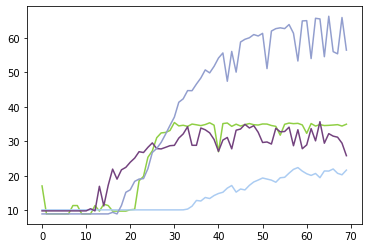

ROUND 69
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.650115


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.089157
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002562

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.696701


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000137
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000004

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.270910
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.062874
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.074013

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.543929
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.137499
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.154738

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.585381
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.017436
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.086849

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

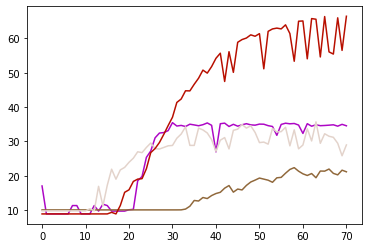

ROUND 70
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.509011


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.028377
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000020

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.012959


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000031
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.569640
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.052360
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.045925

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.205769
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.130714
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.017287

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.357533
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.240726
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.031527

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

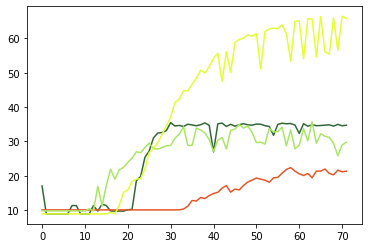

ROUND 71
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.484291


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.055232
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.052939

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.037969


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000968
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.254636

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.923744
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.384148
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.043418

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.505814
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.292747
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006925

Power Allocated= 0
CSI= 0.02416441435143979
SNR= 21.44581976328374
Client: client26
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.444

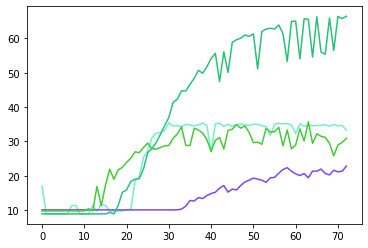

ROUND 72
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.484519


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009405
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.015891

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.960193


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018148
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.839040
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.145583
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011070

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.692698
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.152333
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.020664

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.512002
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.040257
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.107301

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

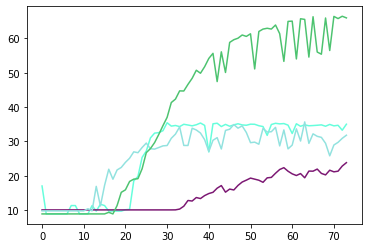

ROUND 73
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.298630


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.076864
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.145543

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.244227


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.098046
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.056843

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.532101
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031042
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.168020

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.547405
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.213465
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.083334

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.526285
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.071169
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.109147

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

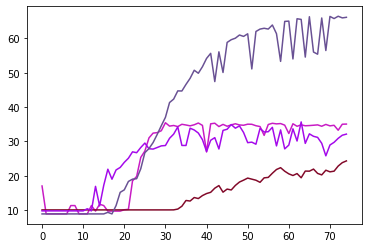

ROUND 74
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.445203


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.052355
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.257506

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.900525


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000003
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.017284

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.879802
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099815
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.445377

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.576732
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.216610
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.153306

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.435323
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.041524
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.453316

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

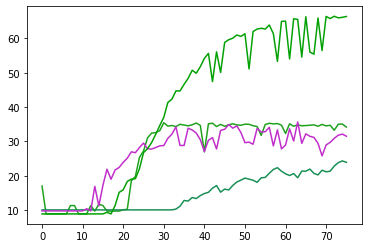

ROUND 75
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.674780


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030430
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.181038

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.942173


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004088
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.548541
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.166820
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.039301

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.552134
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.154865
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002301

Power Allocated= 0
CSI= 0.02416441435143979
SNR= 21.44581976328374
Client: client26
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.444

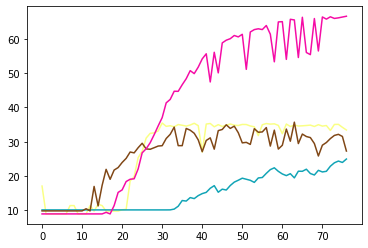

ROUND 76
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.607600


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.045482
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.104967

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.817277


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000610
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000003

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.636255
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031172
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.179562

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.173491
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036860
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.150431

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.389948
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.042846
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011387

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

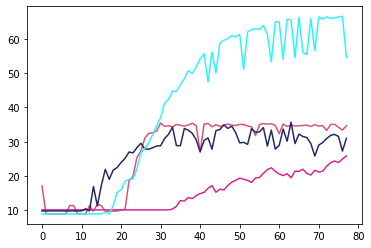

ROUND 77
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.249939


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030979
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.471832

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.615216


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009167
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000609

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.044298
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.127407
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.373064

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.359271
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.071303
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.188335

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.443270
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036785
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003498

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

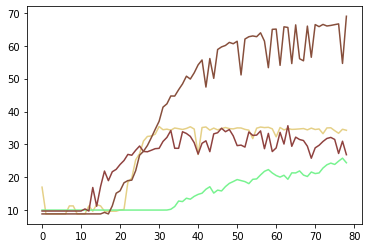

ROUND 78
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.338088


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012730
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.010740

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.003300


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000249
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000179

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.863716
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.090996
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.272032

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.354553
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.042957
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.036783

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.385968
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.128180
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006073

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

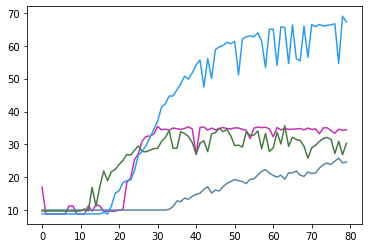

ROUND 79
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.655491


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.084461
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.025163

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.741628


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000506
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.762946
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.058114
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.034617

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.341581
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.045090
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.064942

Power Allocated= 0
CSI= 0.02416441435143979
SNR= 21.44581976328374
Client: client26
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.444

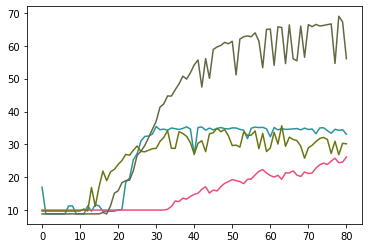

ROUND 80
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.255949


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013680
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.016125

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.338244


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000179
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.980987
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.064060
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.096776

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.350476
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099920
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.421005

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.728998
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053628
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.033560

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

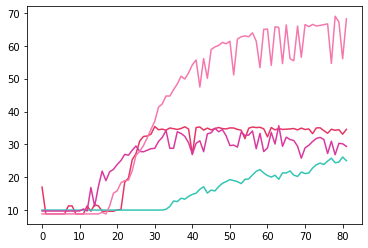

ROUND 81
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.439858


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.174049
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009609

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.027061


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003327
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000021

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.861075
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.200677
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.089752

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.576118
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.356569
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.045796

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.441369
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039020
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.015447

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

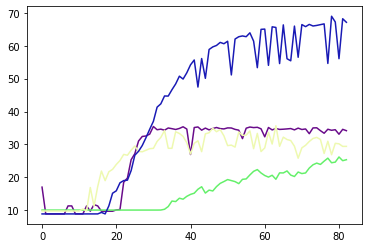

ROUND 82
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.323109


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.119538
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.027459

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.048116


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000001
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.901551
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009169
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.111811

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.375653
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.096949
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.298832

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.689460
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.415693
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.029002

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

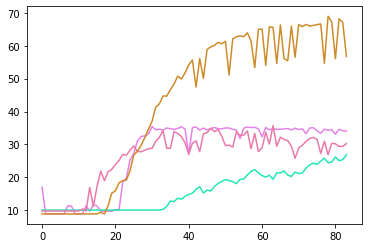

ROUND 83
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.319678


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037915
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.290580

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.466691


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001241
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000321

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.878059
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.071504
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.087620

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.542142
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037538
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.251270

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.597164
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013487
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.096939

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

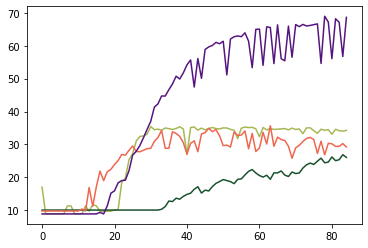

ROUND 84
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.600010


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.044581
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000057

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.646099


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003288
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000053

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.783044
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.102142
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.053003

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.584940
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099701
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.049906

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.428518
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039497
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.265952

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

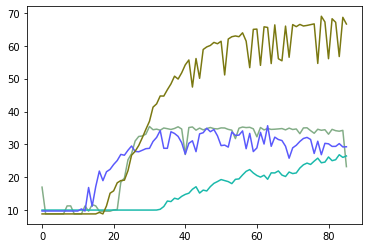

ROUND 85
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.636884


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011971
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.057726

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.782386


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000701
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000004

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.559927
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.155749
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.117402

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.816985
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.046980
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.175535

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.351108
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.055511
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.016734

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

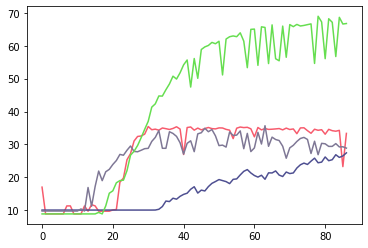

ROUND 86
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.512335


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.046049
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011090

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.792123


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010423
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000192

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.622937
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.248608
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.116764

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.444363
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.108361
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.279342

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.424184
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.032645
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.023408

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

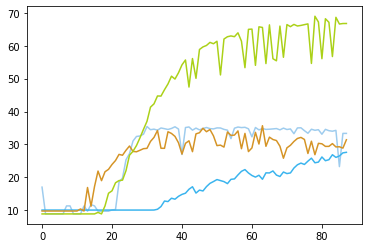

ROUND 87
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.731490


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.199392
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.087892

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.763102


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000298
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.715298
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.094942
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.729627

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.377690
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.342657
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.338971

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.672014
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010634
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028468

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

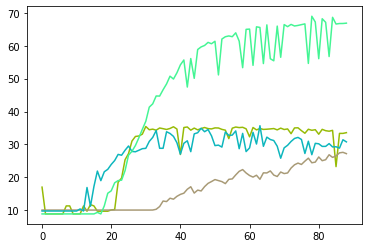

ROUND 88
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.609518


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030158
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.080172

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.555413


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000828
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000163

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.706214
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.149444
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.080652

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.564782
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.132462
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.214021

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.442762
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.045523
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.030923

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

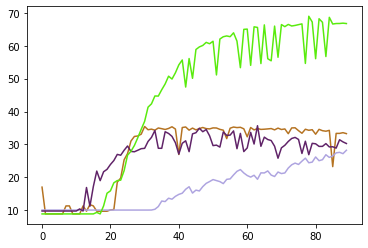

ROUND 89
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.356710


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.061737
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.029619

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.667830


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.162239
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.557837
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027478
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.034896

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.362188
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.109862
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.039852

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.580497
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.035532
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.095489

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

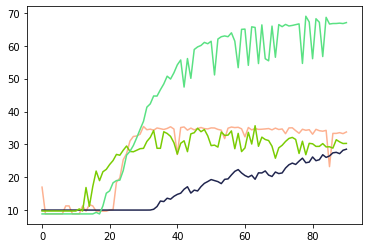

ROUND 90
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.599791


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075193
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003918

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.838123


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000925
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.645549

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.908498
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.380495
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.027677

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.425133
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.152295
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.085685

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.494502
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018464
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.915602

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

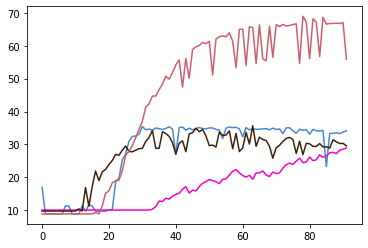

ROUND 91
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.329344


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.054077
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006140

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 3.006258


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.065383
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000441

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.877637
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075685
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.389601

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.338835
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.056220
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003526

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.583952
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.896531
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.901502

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

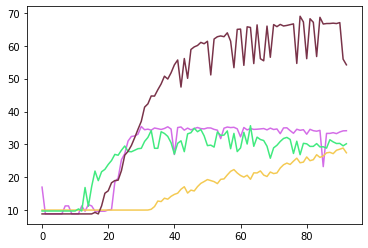

ROUND 92
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.269244


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011696
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.073418

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.395948


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.054483
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000007

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.236803
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.089934
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.031598

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.228711
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.065335
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.296400

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.465221
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.262074
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012533

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

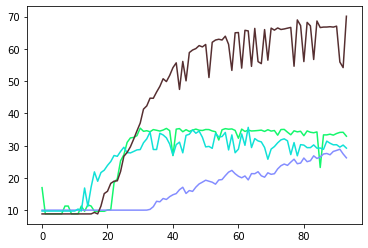

ROUND 93
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.332061


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.068251
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.211926

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.747041


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.142180
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002181

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.638371
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.045557
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.151115

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.250106
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099905
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.039195

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.183339
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014356
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.092005

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

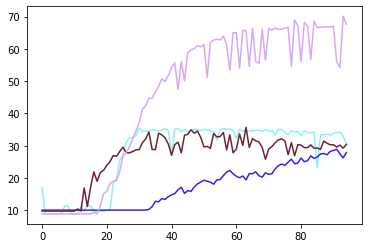

ROUND 94
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.490761


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011808
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008174

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.548337


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007052
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.389430
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.112385
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000339

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.437084
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027774
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.173038

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.298154
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.113010
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.046091

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

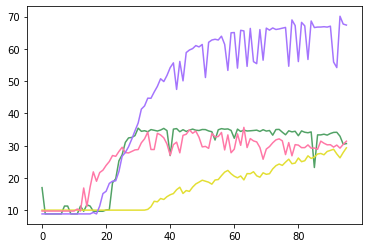

ROUND 95
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.037536


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.020339
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001702

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.871178


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.045100
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004381

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.118193
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015348
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003644

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.493911
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.103401
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.014666

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.577479
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.055845
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.045916

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

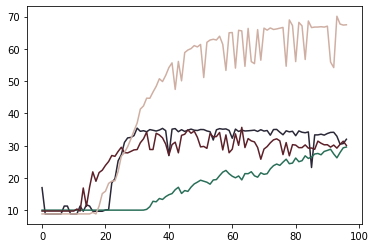

ROUND 96
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.354668


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030720
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.057456

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.511389


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000015
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.411811
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.169811
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.293734

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.438413
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.062420
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.030251

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.453565
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.183953
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002223

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

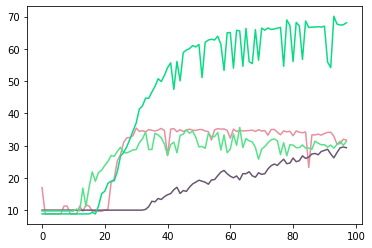

ROUND 97
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.546961


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.056278
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.462305

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.721342


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015034
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.634416
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.223024
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.124458

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.293802
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.071033
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.010488

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.402489
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027107
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.021355

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

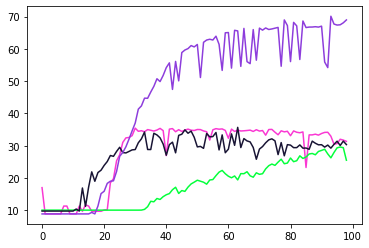

ROUND 98
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.388139


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038149
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.290864

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.705098


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006243
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.071847

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.283168
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018352
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.124619

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.449356
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.175407
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.262499

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.483088
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.156562
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002796

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

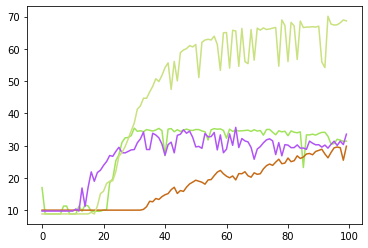

ROUND 99
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.514494


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.034971
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.020498

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.761744


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016892
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.070926

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.635836
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.102596
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.415230

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.416036
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.174757
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.395263

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.269165
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.044434
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.141256

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

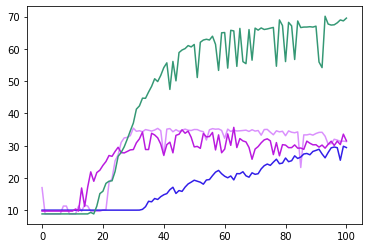

ROUND 100
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.072359


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.141990
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004239

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.770295


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001608
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000087

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.968052
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.078484
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004769

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.492632
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.346295
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.025899

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.408790
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.045793
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.014726

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

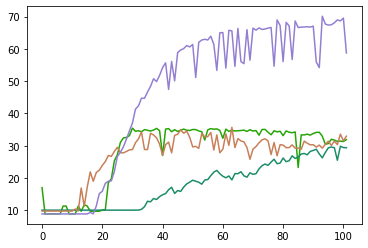

ROUND 101
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.102415


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.029290
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.069375

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.472824


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005352
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000678

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.845174
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030483
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.111409

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.083191
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.113630
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.044802

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.575270
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016630
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.015604

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

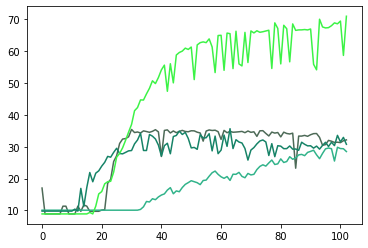

ROUND 102
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.120649


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031256
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006111

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.936557


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000336
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.025661

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.677899
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.047993
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.112640

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.160679
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.153568
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.106965

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.039775
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.105950
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.158516

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

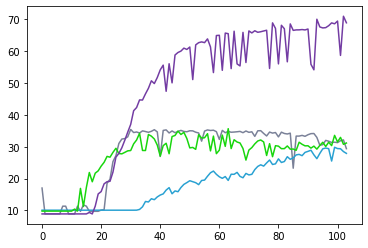

ROUND 103
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.380312


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012083
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.040844

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.450326


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000155
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000213

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.678457
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.046916
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.065407

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.352796
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.209576
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.344408

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.090057
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.131999
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.210902

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

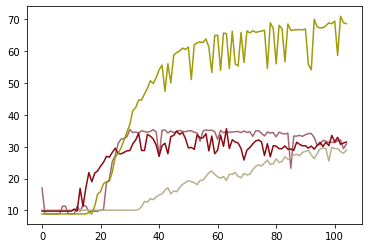

ROUND 104
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.509258


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000803
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.045332

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.773678


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000945
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000206

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.536112
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.029432
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.207609

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.607655
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.089430
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.425671

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.284859
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.028430
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002239

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

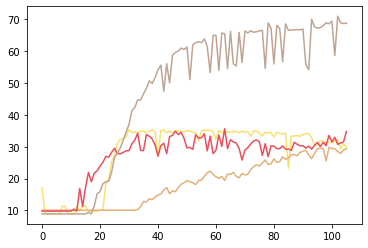

ROUND 105
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.378245


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.211615
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000561

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.669935


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.078775
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.150687

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.982575
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030665
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.074854

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.547177
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.151432
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.276431

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.529415
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.040896
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.024025

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

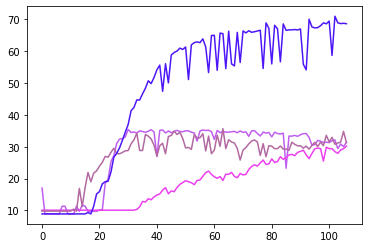

ROUND 106
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.467130


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030137
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011889

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.855546


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001598
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006555

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.515567
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.137599
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.347759

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.610563
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.134629
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.460912

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.148984
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011820
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.021692

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

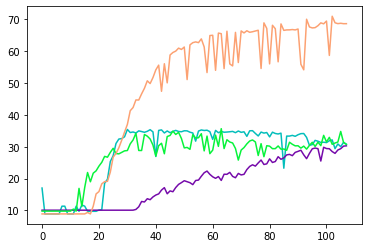

ROUND 107
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.327998


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011877
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.069990

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.488309


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.166104
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.071294

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.749590
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.119970
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.185099

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.655989
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.078539
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.318622

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.204673
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.049502
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002368

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

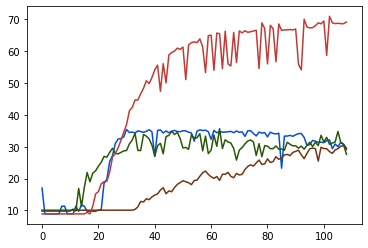

ROUND 108
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.465896


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004556
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.022624

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.595656


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002426
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.035950

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.482646
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.091228
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.418806

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.331149
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.094648
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.182450

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.368862
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.042713
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.745243

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

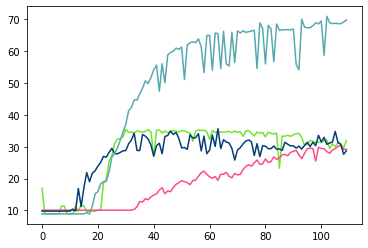

ROUND 109
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.373816


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030106
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007675

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.367993


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.314510
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000118

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.613149
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.237827
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.214214

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.041415
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.109120
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.071361

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.342678
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.060460
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.010415

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

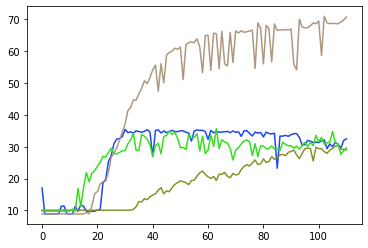

ROUND 110
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.244740


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.168354
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000312

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.664479


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001869
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.070316

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.472684
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.436136
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.126483

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.381013
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099339
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008055

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.084983
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.051783
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028617

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

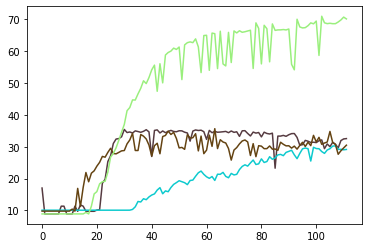

ROUND 111
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.362190


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011907
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006614

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.706459


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003938
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.013921

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.463883
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.175627
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.195599

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.396463
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.064696
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.050449

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.404266
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.116324
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.015063

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

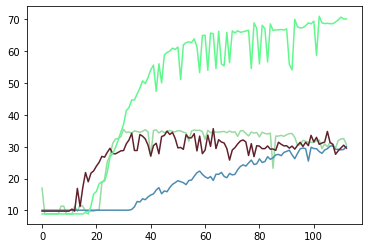

ROUND 112
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.299634


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.055425
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.183465

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.544129


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000031
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000183

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.598917
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.638725
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.190372

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.585500
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.061697
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.170211

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.172374
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.026773
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.112746

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

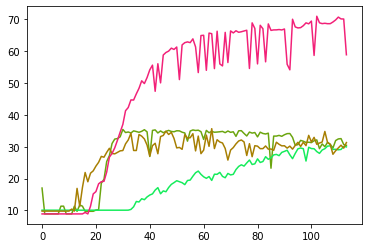

ROUND 113
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.142172


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021248
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.014098

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.531968


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002147
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.284048

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.148586
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.096837
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.307630

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.140892
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037277
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.027562

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.209398
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009526
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000381

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

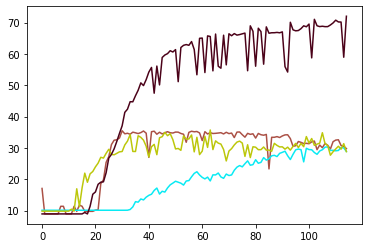

ROUND 114
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.399877


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.029721
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.061218

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.800190


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001852
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000598

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.448167
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.089141
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.537864

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.442204
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.173834
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009111

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.277022
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013908
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008650

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

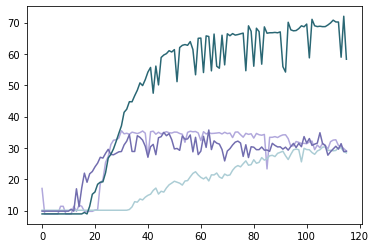

ROUND 115
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.039746


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.070444
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.077501

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.611950


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003077
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000002

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.814661
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.066951
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007920

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.281650
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.086963
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.032321

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.389763
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.033102
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011436

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

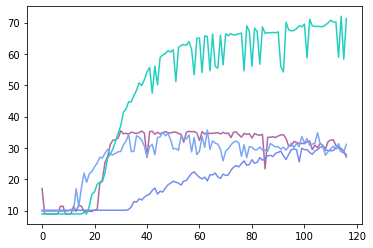

ROUND 116
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.106473


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008790
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002038

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.667792


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.153890
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.026823

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.481722
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.047600
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.274759

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.208156
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.077245
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.047355

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.186492
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.072456
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.019372

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

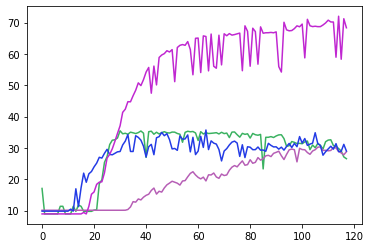

ROUND 117
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.154129


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.082173
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.166008

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.472128


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.084672
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000187

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.416065
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.061218
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.042141

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.247472
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.143059
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.090942

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.356878
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.080380
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.126339

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

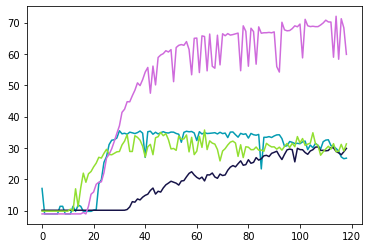

ROUND 118
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.003758


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002932
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.081340

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.412279


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014740
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.015325

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.065447
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.063436
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.310559

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.989891
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.278620
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.109282

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.257921
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.020445
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028517

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

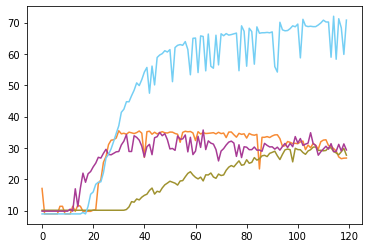

ROUND 119
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.954876


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.050590
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.016187

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.789145


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000278
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001655

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.780166
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.042105
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.014189

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.333260
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.179177
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.162197

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.158631
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.342785
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.141930

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

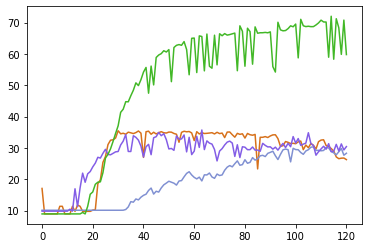

ROUND 120
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.309596


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.020040
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009925

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.373858


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006749
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000231

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.963612
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013456
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006176

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.035321
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.159996
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.337164

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.200731
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007350
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.022496

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

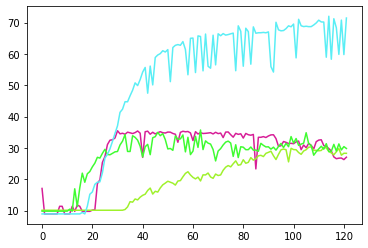

ROUND 121
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.337473


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021283
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001401

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.962508


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038667
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000181

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.425769
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.232827
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007331

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.365999
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.273261
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.851361

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.178605
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.054976
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009918

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

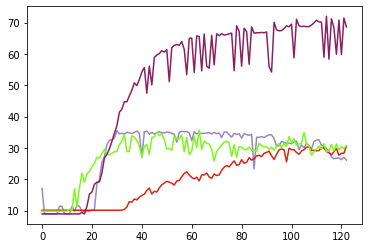

ROUND 122
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.345064


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.070978
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.022688

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.299049


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.147707
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.214046

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.708038
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.076424
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007689

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.320410
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.134420
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.058951

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.291068
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000741
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.020648

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

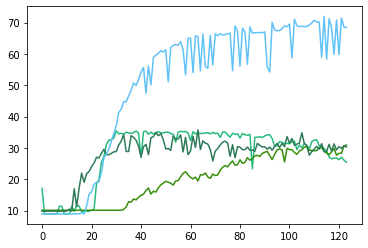

ROUND 123
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.154228


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006307
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008664

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.622055


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.058082
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000511

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.257497
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.212498
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.123196

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.381293
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014019
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.059511

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.334101
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002720
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.021352

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

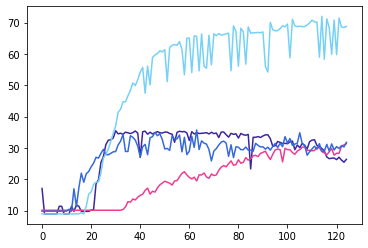

ROUND 124
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.477440


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019728
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.061954

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.560531


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.383110
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.696808
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.137345
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.475100

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.396375
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.092822
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.061512

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.275689
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.033770
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012170

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

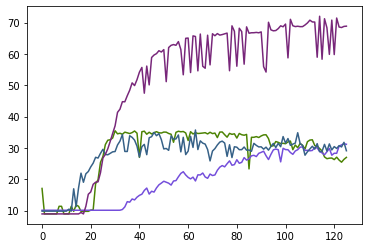

ROUND 125
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.136222


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015457
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000688

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.303584


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.220377
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000634

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.562875
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.059969
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.037787

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.519650
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030141
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.048780

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.226916
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019295
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.283879

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

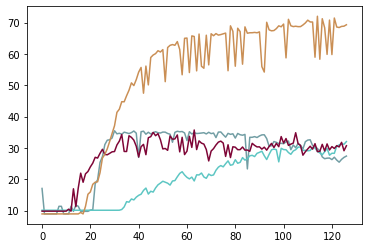

ROUND 126
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.095804


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.034796
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.017061

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.160930


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003754
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.169213

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.356020
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.069796
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.242715

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.483590
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.298217
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.960361

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.329837
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010847
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 5.394574

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

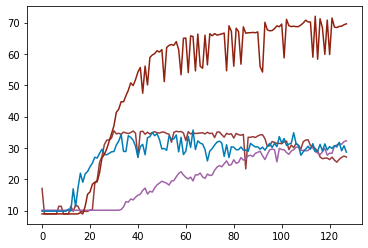

ROUND 127
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.275398


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.044186
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.039828

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.314472


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011231
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.923307

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.531484
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.086073
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.115072

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.563279
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.071079
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.030136

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.382554
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.022991
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.105767

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

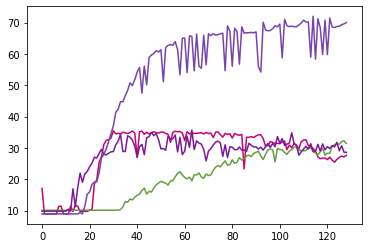

ROUND 128
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.866417


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.119554
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.197477

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.523259


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021767
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.233011

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.501975
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016110
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.015655

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.332719
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.028299
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.066630

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.309584
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.387175
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.174575

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

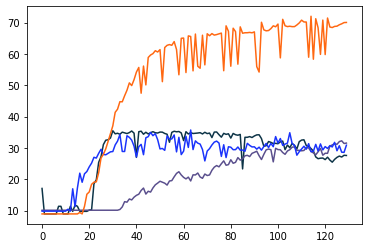

ROUND 129
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.307007


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024794
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.122229

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.248323


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008094
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001218

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.906519
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.092340
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.237350

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.363124
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.041963
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.047021

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.179932
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019711
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.705520

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

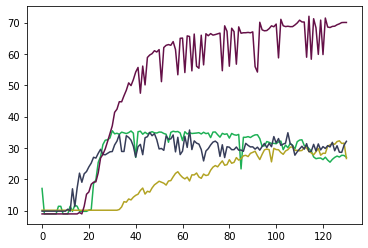

ROUND 130
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.146486


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007031
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.088204

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.646545


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.042977
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000180

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.465305
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.107504
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028018

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.330534
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.077177
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007570

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.204618
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.062308
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.174863

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

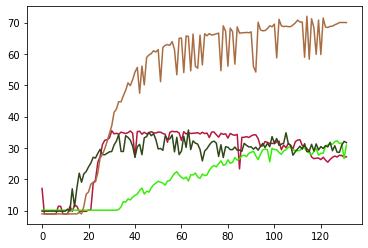

ROUND 131
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.298284


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.079963
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.017204

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.831710


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018379
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003756

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.576556
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018738
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.027011

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.409013
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.033867
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.275437

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.280124
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012835
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.159775

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

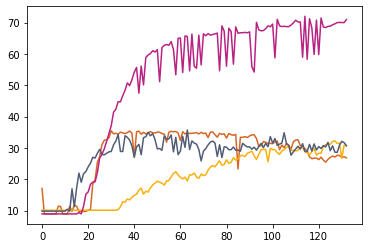

ROUND 132
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.462189


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.025503
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.047183

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.606623


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001697
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000184

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.202233
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.201744
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.097197

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.392949
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013417
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.088352

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.456482
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036027
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028536

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

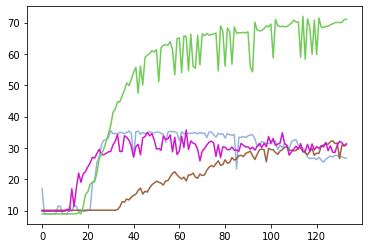

ROUND 133
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.007349


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015750
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.031593

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.251903


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005401
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.360894

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.509423
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.144747
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.026031

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.233227
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.035458
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.132077

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.150585
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013457
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.056148

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

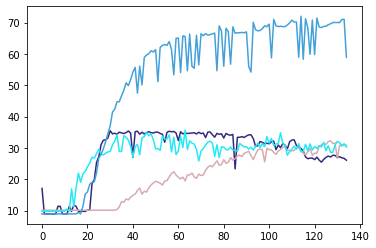

ROUND 134
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.231691


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023597
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.039988

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.358844


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.058525
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.065450

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.885108
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.266807
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.031616

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.969465
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048130
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.077219

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.530410
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018525
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.069534

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

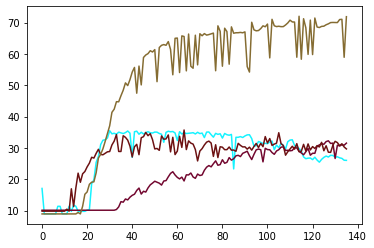

ROUND 135
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.966853


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018105
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003247

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.562711


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005180
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.242628
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.033902
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000600

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.966784
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.102318
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.016515

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.289416
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011042
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003153

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

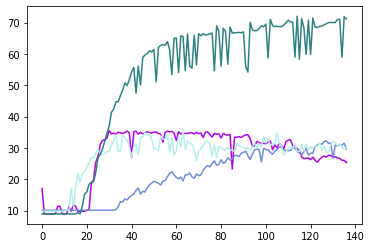

ROUND 136
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.267736


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.034011
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011307

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.398836


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.052637
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.140423

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.024118
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.060676
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.339568

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.450191
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019802
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002795

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.050569
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053547
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.029833

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

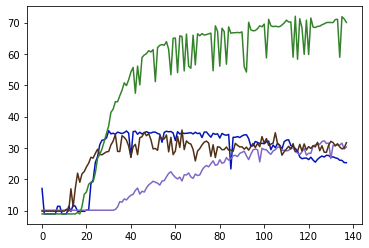

ROUND 137
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.026232


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013961
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.062659

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.355722


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.095227
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.195257

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.763491
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.107101
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.434876

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.436449
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.115841
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.072861

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.114416
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027465
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.047422

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

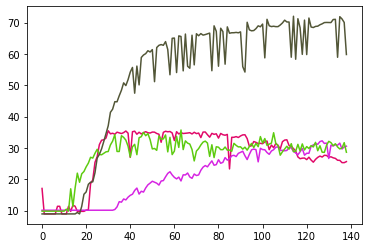

ROUND 138
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.170526


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030603
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002897

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.530173


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002892
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009623

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.143759
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075268
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.064458

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.159745
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.043896
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.025781

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.327575
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.076317
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.252823

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

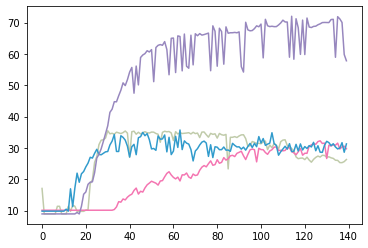

ROUND 139
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.214083


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030171
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008715

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.554116


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006245
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.065747

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.924747
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.105129
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.989960

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.225932
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023462
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.101899

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.352235
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.041502
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.158560

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

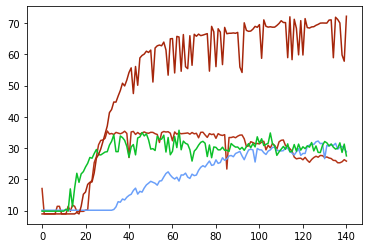

ROUND 140
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.951466


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004700
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.013326

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.764579


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.032133
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.192080

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.578658
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.103612
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.056924

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.197704
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.197600
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.296379

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.058958
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.044659
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.020202

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

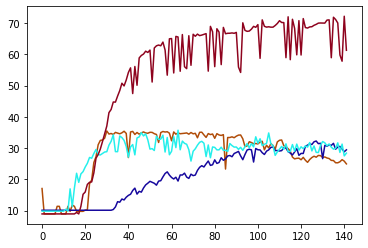

ROUND 141
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.136022


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.034781
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007627

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.490137


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004686
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002161

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.944511
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.146773
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004939

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.083498
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.042722
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.027264

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.070387
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.069142
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.044612

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

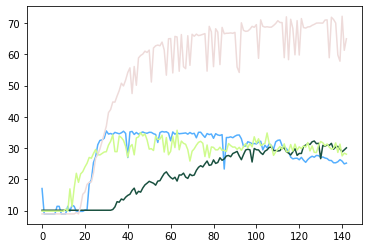

ROUND 142
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.836791


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038893
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.054228

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.863000


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038542
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000135

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.930665
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030571
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.014483

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.269003
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.044897
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.040338

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.513395
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019096
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006616

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

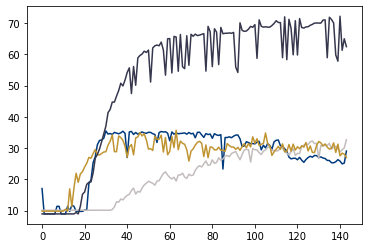

ROUND 143
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.147011


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.057642
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.005779

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.329807


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001592
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.902603
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.147267
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.026499

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.294434
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.062869
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.293618

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.634578
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.033006
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.014092

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

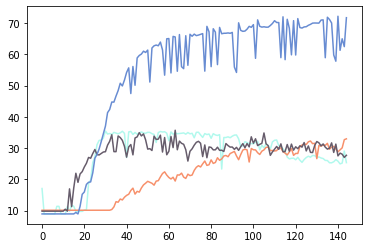

ROUND 144
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.305870


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.047839
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004526

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.578876


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002874
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000424

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.405452
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.194007
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.584773

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.145179
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.110999
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.217948

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.098010
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.111403
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.024237

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

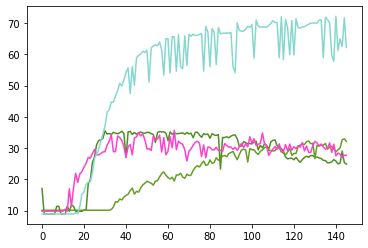

ROUND 145
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.116284


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.020369
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.135271

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.254072


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001393
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000584

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.002666
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010234
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.050939

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.824783
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.051690
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.127291

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.235826
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.032264
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.015835

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

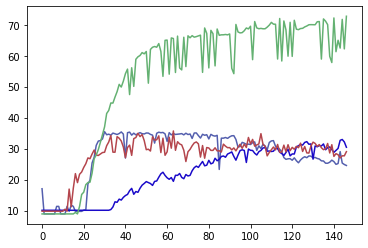

ROUND 146
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.136263


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011834
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.073097

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.528240


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000295
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000413

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.699069
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.235034
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000058

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.804573
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.126517
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.022143

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.022264
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018023
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000016

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

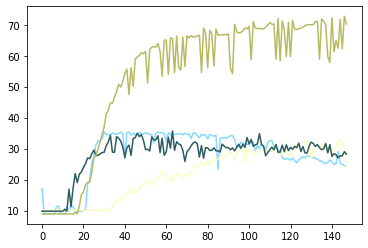

ROUND 147
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.175656


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003193
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000497

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.510146


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001623
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001972

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.263177
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030714
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.030788

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.361144
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.135417
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.186842

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.214456
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.060656
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011818

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

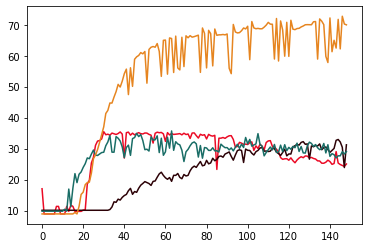

ROUND 148
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.122749


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.202180
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012579

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.271168


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000502
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.051618

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.079825
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.235635
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.116701

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.374003
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.065985
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.247519

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.271842
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.026205
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.340789

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

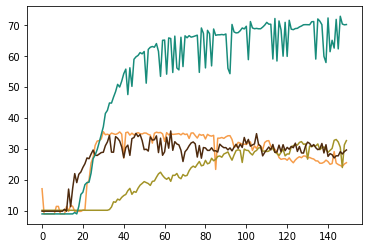

ROUND 149
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.506865


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.070747
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000055

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.259021


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.042570
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.151732

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.546421
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.281620
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008599

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.080266
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.077145
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.923083

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.345157
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.140467
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.036898

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

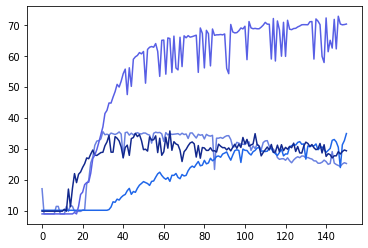

ROUND 150
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.216973


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023994
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001054

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.348958


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000026
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000031

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.395870
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048499
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.087914

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.420926
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.072695
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.427245

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.233818
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019463
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.018506

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

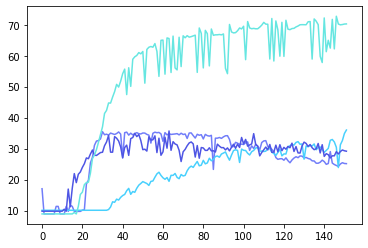

ROUND 151
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.011572


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009445
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000646

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.463918


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000688
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.514793
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.137138
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.064903

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.897313
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.132471
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.059999

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.478749
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.034465
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.220412

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

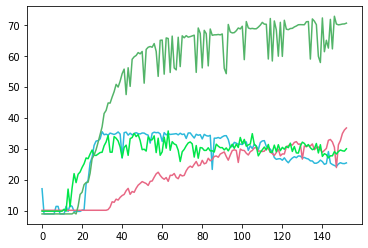

ROUND 152
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.374778


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009172
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.427786

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.350446


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.029452
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000195

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.532726
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021792
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012701

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.552051
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.223330
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004776

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.259795
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010955
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012947

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

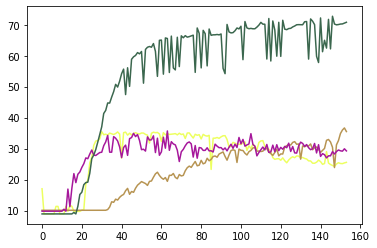

ROUND 153
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.093991


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002338
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.403727

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.414229


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.056795
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000912

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.334080
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075955
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.045776

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.113594
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.026503
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012270

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.352264
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.082570
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009507

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

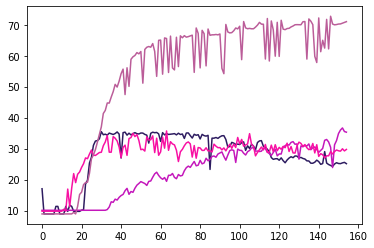

ROUND 154
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.483460


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006383
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.047206

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.428134


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.082772
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000186

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.229395
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.094030
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.191626

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.914903
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.029997
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.132000

Power Allocated= 0
CSI= 0.02416441435143979
SNR= 21.44581976328374
Client: client26
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.444

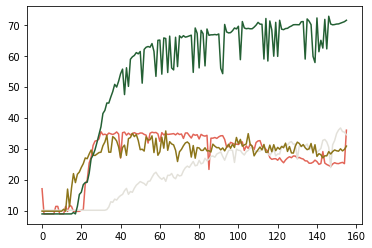

ROUND 155
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.228773


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037979
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.110549

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.616946


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030866
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000094

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.170057
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.113680
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.115007

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.331197
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.072369
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.025740

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.112436
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008579
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.116644

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

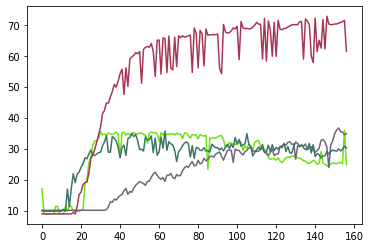

ROUND 156
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.928534


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.028855
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004622

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.360531


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.022846
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000359

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.864402
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036237
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.499181

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.372513
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.148762
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.134178

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.342988
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009665
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.105936

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

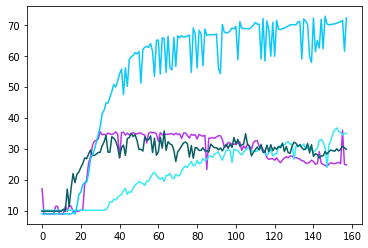

ROUND 157
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.069162


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008252
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.112428

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.610047


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000010
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.433240
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.040355
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.150098

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.141713
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014687
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001363

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.774866
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.113137
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.014027

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

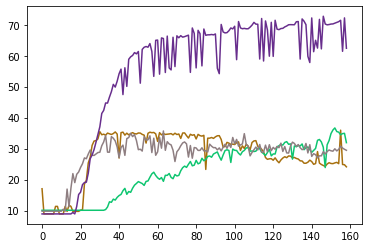

ROUND 158
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.915723


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.120323
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.143729

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.430704


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000351
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.808212
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.074252
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.760259

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.173281
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.034444
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.122680

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.904508
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006927
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.522816

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

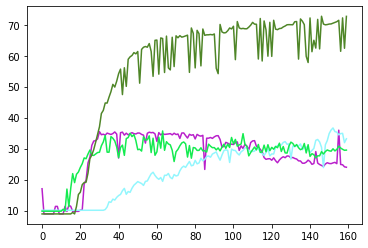

ROUND 159
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.079052


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.100709
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000182

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.835364


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000152
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001523

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.602830
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.165663
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.277772

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.376646
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.074850
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.075729

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.849222
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011924
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.082821

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

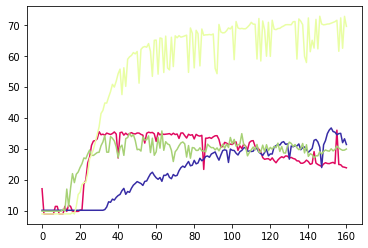

ROUND 160
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.373940


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038677
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.023315

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.392050


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004491
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000188

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.604625
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.115655
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.350034

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.444304
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099087
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.251516

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.272274
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009212
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.299766

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

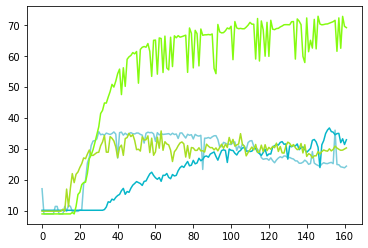

ROUND 161
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.882290


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014473
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000031

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.369092


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000558
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000968

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.318104
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.116499
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.154968

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.370637
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.170896
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.192301

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.363538
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099715
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.035683

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

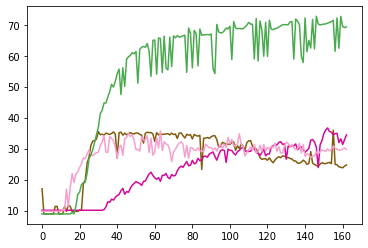

ROUND 162
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.352187


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.092940
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000018

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.420638


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030800
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.818853
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.178362
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.154596

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.560900
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.044157
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.354161

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.623644
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.020417
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.029831

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

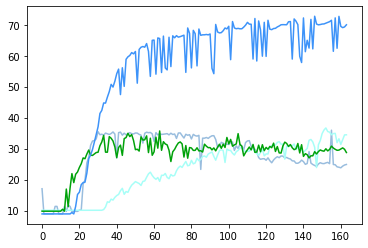

ROUND 163
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.037060


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031216
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.359364

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.306149


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002458
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.052774

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.397347
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.334164
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.238755

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.239054
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030920
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.489776

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.350323
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.121763
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.038381

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

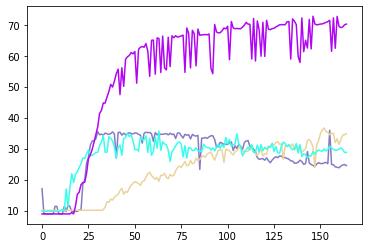

ROUND 164
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.216811


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.029108
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004891

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.417092


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.084213
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000407

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.383924
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.202435
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.593665

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.196908
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.162534
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.087198

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.373605
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019845
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008727

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

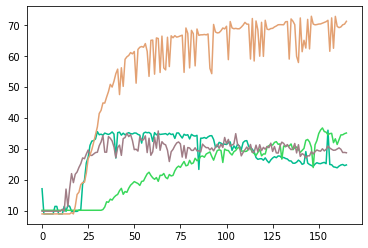

ROUND 165
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.326556


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.067130
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.373729

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.380910


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001250
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000643

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.548275
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.160275
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.328241

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.285304
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.110594
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008437

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.171159
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.080002
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.022250

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

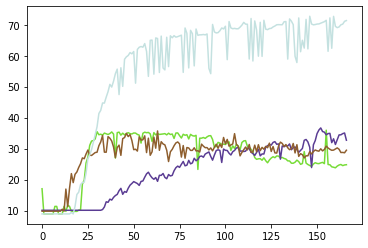

ROUND 166
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.013119


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005881
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.025784

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.369156


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.035616
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.511456
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.184406
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.164539

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.013936
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.076302
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.225493

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.171657
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036805
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.154102

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

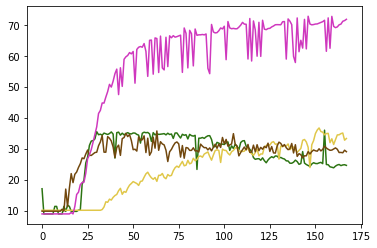

ROUND 167
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.988621


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023188
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.058405

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.348853


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.063133
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000068

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.354391
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.028836
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.177098

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.058781
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.040474
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.060908

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.324362
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027703
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.018583

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

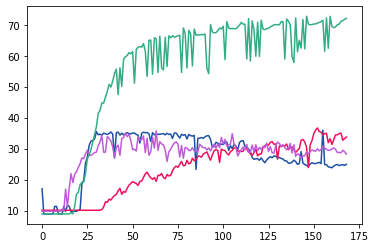

ROUND 168
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.379171


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023914
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.087006

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.692143


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.040487
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000416

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.333044
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.044092
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.232196

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.176883
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.079577
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.044252

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.303058
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.107232
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008480

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

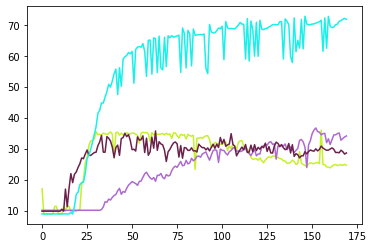

ROUND 169
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.988295


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.146786
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.043031

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.620367


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002745
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000967

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.418950
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.097331
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.202466

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.144367
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.149636
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.197560

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.083444
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010234
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.401660

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

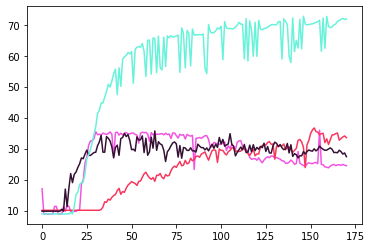

ROUND 170
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.588981


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.270330
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.044597

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.560159


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002310
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002766

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.723144
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.143036
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.670206

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.151880
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005008
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011731

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.996702
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003080
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.230690

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

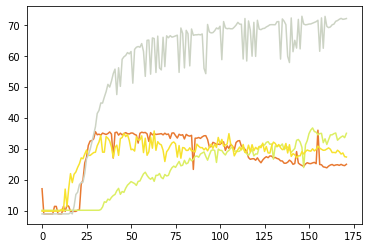

ROUND 171
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.250403


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.047280
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.005861

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.269901


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002481
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001381

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.155220
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.047396
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.118105

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.278959
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.043802
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004367

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.068503
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.079788
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.015142

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

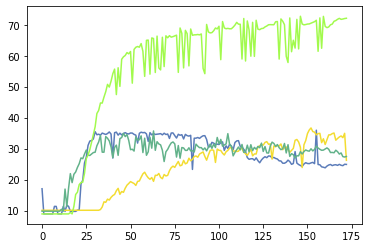

ROUND 172
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.082783


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.041124
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003549

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.544995


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010377
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.068134

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.209485
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.182346
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.175771

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.029567
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014643
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.269753

Power Allocated= 0
CSI= 0.02416441435143979
SNR= 21.44581976328374
Client: client26
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.444

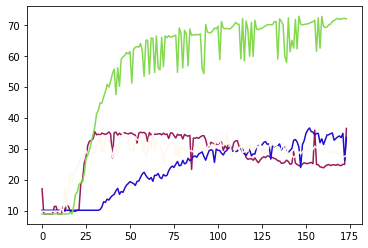

ROUND 173
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.226923


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.070729
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007100

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.604398


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001565
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.033018

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.795685
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030015
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.814926

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.087525
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.082768
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.165647

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.221703
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015706
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.368973

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

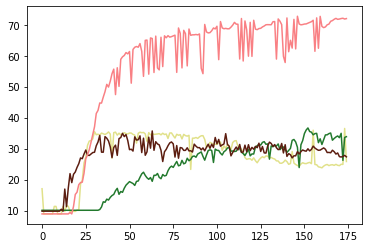

ROUND 174
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.169665


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013283
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007870

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.646353


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000162
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000061

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.395282
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023721
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012939

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.580287
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.080292
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.124932

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.290458
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011930
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.053250

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

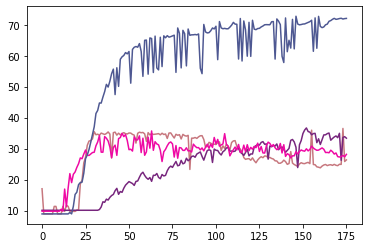

ROUND 175
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.239649


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038381
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.029065

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.460746


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039795
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000332

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.551212
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.095768
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.134990

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.457806
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.017569
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.058168

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.941978
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039728
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.054392

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

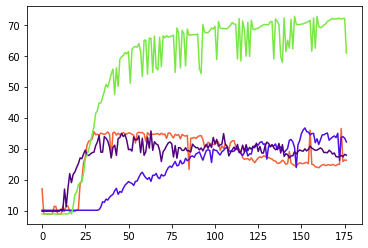

ROUND 176
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.084310


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007403
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.013694

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.519760


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010374
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.117304

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.636721
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.088040
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.113968

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.406599
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.026805
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.020476

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.378732
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005567
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.279233

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

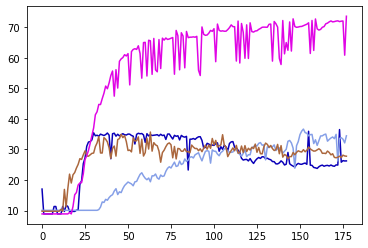

ROUND 177
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.985243


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.045185
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.057979

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.828232


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099034
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000223

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.463887
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024109
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.023979

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.304340
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.063901
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009186

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.841188
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027531
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.030273

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

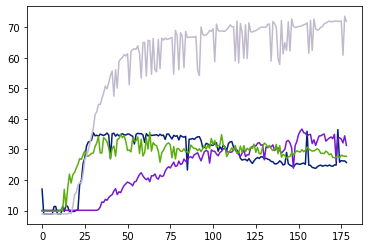

ROUND 178
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.733882


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012481
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006652

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.572124


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.545504
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.427750

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.655244
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.078465
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.240088

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.985441
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.068353
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000147

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.031564
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031911
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.042962

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

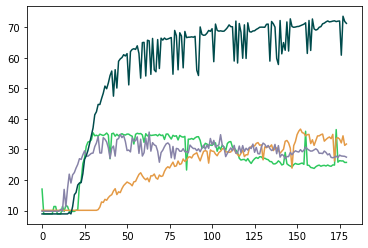

ROUND 179
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.921376


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039804
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012313

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.512300


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004028
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.229079

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.247127
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015257
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.132759

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.175108
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.017373
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008659

Power Allocated= 0
CSI= 0.02416441435143979
SNR= 21.44581976328374
Client: client26
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.444

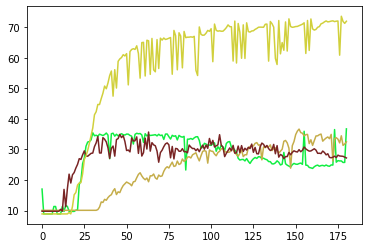

ROUND 180
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.010382


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.020764
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.036981

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.080415


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002058
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000810

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.391716
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.181212
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.079645

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.280704
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.025497
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006223

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.338299
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.065380
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.026673

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

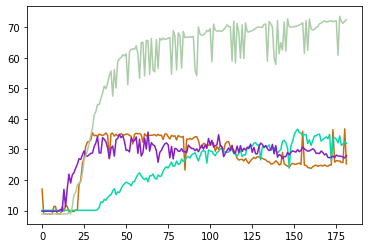

ROUND 181
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.901177


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.052705
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.013652

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.767840


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.226914
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.472248

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.146814
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.130511
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.066435

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.860847
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.082260
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.107584

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.154021
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.073252
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.152583

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

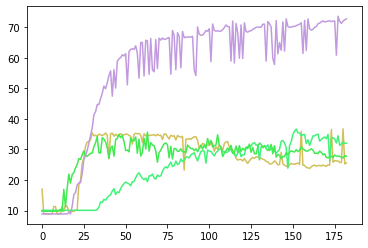

ROUND 182
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.017347


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013269
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001425

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.412257


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.080410
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.132440

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.341897
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.133676
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.076862

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.456435
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.020170
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008610

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.919686
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039466
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000343

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

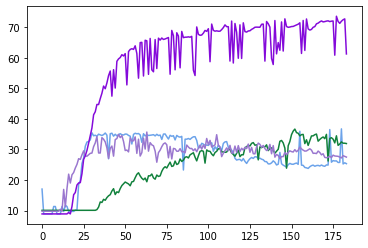

ROUND 183
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.045326


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.156054
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003526

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.869582


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.067786
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.087548

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.038154
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.069695
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.874923

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.388717
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.045940
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002791

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.188180
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003770
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.021555

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

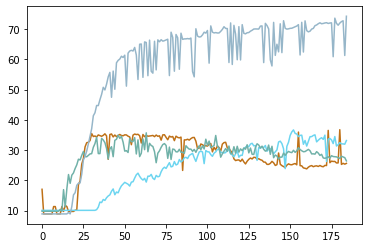

ROUND 184
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.184170


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.043857
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007078

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.489799


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.226894
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.088186

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.475250
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009309
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.043634

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.619334
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.017900
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.117263

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.864418
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031918
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.081349

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

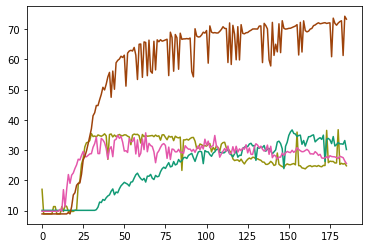

ROUND 185
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.294462


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038965
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008220

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.733852


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039439
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001107

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.185330
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.067426
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.005191

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.997278
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.032483
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001108

Power Allocated= 0
CSI= 0.02416441435143979
SNR= 21.44581976328374
Client: client26
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.444

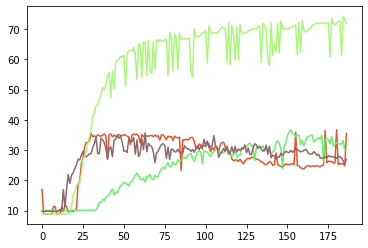

ROUND 186
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.846840


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014014
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006505

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.150453


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.140193
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.393208

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.139108
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099096
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.126082

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.116465
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.051284
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007713

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.053952
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012858
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000278

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

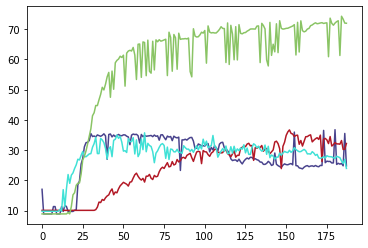

ROUND 187
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.887573


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038424
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012184

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.552745


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.294064
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.060406

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.343455
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.054519
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.065715

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.292547
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023349
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.138776

Power Allocated= 0
CSI= 0.02416441435143979
SNR= 21.44581976328374
Client: client26
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.444

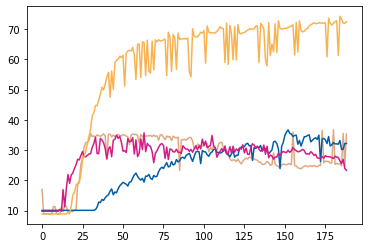

ROUND 188
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.053169


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027121
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011203

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.430285


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009071
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.068512

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.332825
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.020260
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.210718

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.330760
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.182776
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.247104

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.963900
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024492
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008544

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

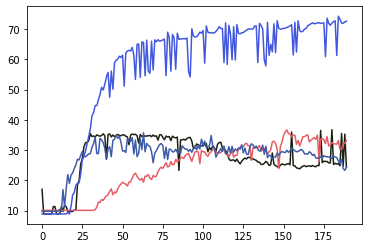

ROUND 189
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.900803


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.028611
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.015387

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.279905


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005119
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.073548

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.390249
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.081754
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.036272

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.185650
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037098
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.073377

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.139361
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.020372
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.083281

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

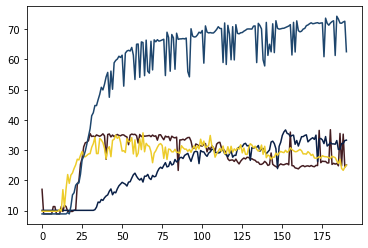

ROUND 190
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.415628


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.043094
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002628

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.337271


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015063
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.050892

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.971450
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.025247
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.018164

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.035155
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.065877
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.172577

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.159882
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013225
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028714

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

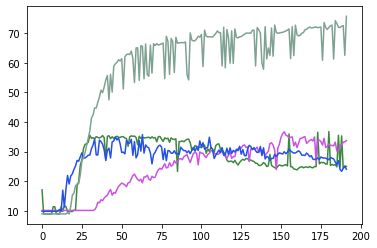

ROUND 191
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.928242


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019305
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.597832


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.047526
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000548

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.459463
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.107732
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.038249

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.114549
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019909
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003155

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.026368
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001108
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.162999

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

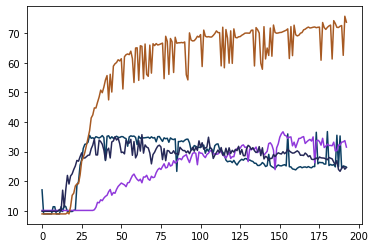

ROUND 192
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.817592


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009938
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.014607

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.269840


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.072363
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008036

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.560212
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.059302
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.028592

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.392583
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039305
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.145518

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.995417
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024275
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.014386

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

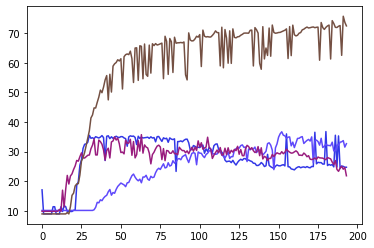

ROUND 193
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.293988


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003747
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000003

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.332461


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006879
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.091505

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.504597
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.074000
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.048689

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.289237
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024371
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002185

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.148005
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.135183
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006527

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

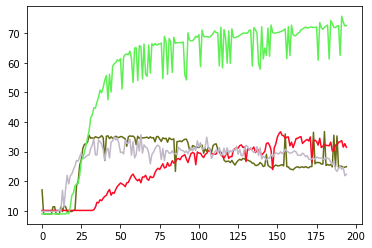

ROUND 194
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.288063


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002805
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.026760

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.197271


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009137
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000786

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.272985
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.247034
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.253228

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.120953
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012022
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.019654

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.143507
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.052399
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.044923

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

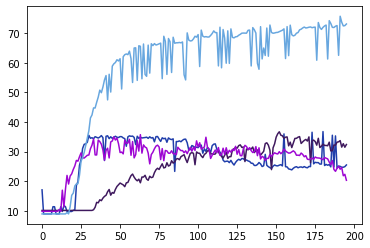

ROUND 195
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.057359


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012083
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004149

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.223795


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039594
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000925

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.380710
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.109850
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.623968

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.272667
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037557
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009339

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.977391
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014575
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007819

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

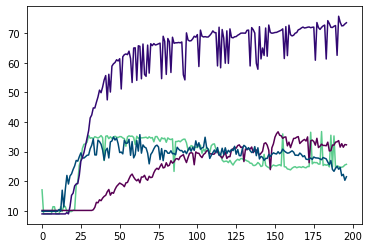

ROUND 196
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.054928


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037978
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.022772

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.273216


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099736
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.335079

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.160753
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018663
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.046514

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.908124
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000134
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.076273

Power Allocated= 0
CSI= 0.02416441435143979
SNR= 21.44581976328374
Client: client26
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.444

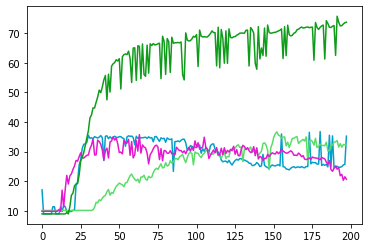

ROUND 197
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.910317


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024052
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.023186

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.424048


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.040108
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001350

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.307874
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.143769
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.119890

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.576259
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012389
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.032834

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.210959
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.033565
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.388637

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

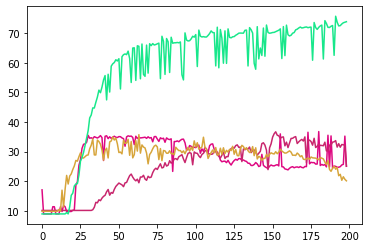

ROUND 198
0.1266200000000173
Power Allocated= 6.6820510675208
CSI= 0.8226421161001846
SNR= 30.1537606030424
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.254901


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.045697
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000016

Power Allocated= 0
CSI= 0.10364165657284252
SNR= 34.011926683521345
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.875431030694221
CSI= 0.9782673308268052
SNR= 26.913716535749238
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.216501


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015888
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000883

Power Allocated= 6.372042981701522
CSI= 0.6554782989986631
SNR= 22.34996550173198
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.315045
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030598
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.744141

Power Allocated= 6.680533215618245
CSI= 0.8216162059275728
SNR= 33.97075867959965
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.135338
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006117
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003624

Power Allocated= 6.1913829580918724
CSI= 0.5860759341405486
SNR= 26.846823935467672
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.198950
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023150
Model client24 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000308

Power Allocated= 0
CSI= 0.02416441435143979
SNR=

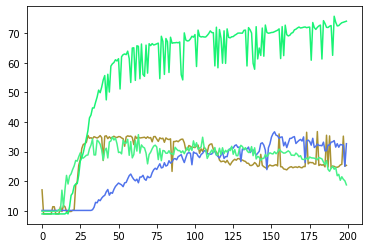

ROUND 199


In [14]:
for client in clients: #give the model and optimizer to every client
    torch.manual_seed(args.torch_seed)
    client['model'] = Net().to(device)
    #client['model'] = torch.quantization.quantize_dynamic(
    #client['model'],  # the original model
    #{torch.nn.Linear},  # a set of layers to dynamically quantize
    #dtype=torch.fp)  # the target dtype for quantized weights
    client['optim'] = optim.SGD(client['model'].parameters(), lr=args.lr)

final_acc=[]
final_loss=[]
    
for fed_round in range(args.rounds):
    overall=Net()
    if(fed_round==0): #fed_round==0
        arranged_clusters,head_snr_list=cluster_former(args.numclusters,args.clients)
        temp=deepcopy(arranged_clusters)
        temp2=deepcopy(head_snr_list)
    else:
        #print(temp)
        arranged_clusters=deepcopy(temp)
        head_snr_list=deepcopy(temp2)
#     print(arranged_clusters)
    
    no=1
    heads_list=[]
    weights=[]
    weight_head_list=[]
    head_acc=[]
    head_loss=[]
    for cluster in arranged_clusters:
        
        head=cluster['Cluster Head']
        members=cluster['Members']
        snrs=cluster['SNR']
        csis=cluster['CSI']
        weights.append(sum(snrs))
        weight_head_list.append([head,sum(snrs)])
        new_members=[]
        
        for ij in members:
        #print(ij)
            cl_no=int(ij[6:])
            new_members.append(clients[cl_no-1])
#         print(head)
        head=clients[int(head[6:])-1]
        cluster['Members']=new_members
#         print(head)

        smallmu1=0
        gsmall1=3.402823466E+38 
        
        #water filling algorithm
        mu=1e-15
        while(mu<=1):
            g1=0
            pn1=0
            for jj in csis:
                pn=max(1/mu-1/jj,0)
                g1+=math.log(1+pn*jj) #capacity of a channel (shannon's law)
                pn1+=pn
            g=g1-mu*(pn1-P*30)
            if(g<gsmall1):
                smallmu1=mu
                gsmall1=g
            mu+=0.00002
        
        print(smallmu1)
        good_mem=[]
#         print(len(snrs))
#         print(len(csis))
#         print(len(new_members))
        index=0
        for client in new_members:
            goodchannel=ClientUpdate(args, device, client,key_np,key,snrs[index],csis[index],smallmu1,head)
            index+=1
            if(goodchannel):
                good_mem.append(client)
        
        head['model']=averageModels(head['model'], good_mem)
        arr=test(args,head['model'], device, global_test_loader, 'Cluster'+str(no),fed_round)
        ac=arr[0]#test(args,head['model'], device, global_test_loader, 'Cluster'+str(no),fed_round)[0]
        no+=1
        heads_list.append(head)
        head_acc.append(ac)
        head_loss.append(arr[1])#test(args,head['model'], device, global_test_loader, 'Cluster'+str(no),fed_round)[1])
    
    final_acc.append(head_acc)
    final_loss.append(head_loss)
    fig,ax=plt.subplots()
    clor = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in range(args.numclusters)]
    #ax.plot([i for i in range(fed_round)],head_acc[0])
    for jj in range(0,args.numclusters):
        
        ax.plot([i for i in range(len(final_acc))],[final_acc[j][jj] for j in range(len(final_acc))], color = clor[jj])
        
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][0] for j in range(len(final_acc))], color ="red")
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][1] for j in range(len(final_acc))],color ="blue")
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][2] for j in range(len(final_acc))],color ="green")
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][3] for j in range(len(final_acc))],color ="black")
    #ax.plot([i for i in range(len(final_acc))],head_acc[1], fed_round, color ="blue")
    #ax.plot([i for i in range(len(final_acc))],head_acc[2], fed_round, color ="green")
    #ax.plot([i for i in range(len(final_acc))],head_acc[3], fed_round, color ="black")
    
    
    plt.show()
    weightsum=sum(weights)
    
    weights[:] = [x / weightsum for x in weights]
    for aah in range(len(weight_head_list)):
        weight_head_list[aah][1]=weights[aah]
    final_heads,nets=decentralized(heads_list,head_snr_list,weight_head_list)
    
    for head in range(len(final_heads)):
        for cluster in arranged_clusters:
            head1=cluster['Cluster Head']
            if(head1==final_heads[head]['hook'].id):
                for mem in cluster['Members']:
                    mem['model'].load_state_dict(nets[head].state_dict())
    print("ROUND",fed_round)

In [15]:
print(final_acc)

[[17.05, 10.09, 9.8, 8.92], [8.92, 10.09, 9.8, 8.92], [8.92, 10.09, 9.8, 8.92], [8.92, 10.09, 9.8, 8.92], [8.92, 10.09, 9.8, 8.92], [8.92, 10.09, 9.8, 8.92], [8.92, 10.09, 9.8, 8.92], [11.35, 10.09, 9.8, 8.92], [11.35, 10.09, 9.8, 8.92], [8.92, 10.09, 9.8, 8.92], [8.92, 10.09, 9.8, 8.92], [8.92, 10.09, 10.43, 8.92], [11.35, 10.09, 9.8, 8.92], [9.74, 10.09, 16.94, 8.92], [11.74, 10.09, 11.25, 8.92], [11.35, 10.09, 17.24, 8.92], [9.74, 10.09, 21.93, 9.38], [9.74, 10.09, 19.02, 8.92], [9.74, 10.09, 21.72, 11.36], [9.74, 10.09, 22.45, 15.2], [10.13, 10.09, 23.93, 15.93], [10.25, 10.09, 25.13, 18.37], [18.55, 10.09, 26.99, 19.04], [19.82, 10.09, 26.74, 19.17], [25.37, 10.09, 28.25, 22.06], [27.22, 10.09, 29.54, 26.75], [31.05, 10.09, 27.89, 27.94], [32.44, 10.09, 27.79, 29.69], [32.58, 10.09, 28.25, 32.06], [33.14, 10.09, 28.73, 34.61], [35.46, 10.09, 28.83, 37.04], [34.48, 10.09, 30.93, 41.34], [34.66, 10.1, 32.15, 42.34], [34.34, 10.33, 34.25, 44.73], [35.01, 11.16, 28.85, 44.7], [34.8, 1